<a href="https://colab.research.google.com/github/Poovarasan0368/Netflix_Movies_and_TV_Shows_Clustering/blob/main/Netflix_Movies_and_TV_Shows_Clustering_Final_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Netflix_Movies_and_TV_Shows_Clustering </u></b>


## **Problem Statement**

This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

## ![image.png](https://holatelcel.com/wp-content/uploads/2022/04/netflix-codigos-ocultos-para-ver-series-peliculas.gif)

##**Attribute Information**

**show_id :** Unique ID for every Movie / Tv Show

**type :** Identifier - A Movie or TV Show

**title :** Title of the Movie / Tv Show

**director:** Director of the Movie

**cast :** Actors involved in the movie / show

**country :** Country where the movie / show was produced

**date_added :** Date it was added on Netflix

**release_year :** Actual Release year of the movie / show

**rating :** TV Rating of the movie / show

**duration :** Total Duration - in minutes or number of seasons

**listed_in :** Genre

description: The Summary description

# **Import libraies and datasets**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
from datetime import datetime
import datetime as dt
import warnings
warnings.filterwarnings("ignore")


In [ ]:
# mount the google drive 
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# reading seol Netflix data set
Netflix_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Netflix/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

# **Explore the datesets**  

In [ ]:
# Shape of the Data frame 
Netflix_df.shape

(7787, 12)

In [ ]:
# head of the data frame
Netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
# Tail of the dataframe 
Netflix_df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


In [ ]:
# columns of the  dataframe 
Netflix_df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Discreption of data frame 
Netflix_df.describe(include= 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7787,7787,s1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7787,2,Movie,5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7787,7787,3%,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,5398,4049,"Raúl Campos, Jan Suter",18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7069,6831,David Attenborough,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7280,681,United States,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_added,7777,1565,"January 1, 2020",118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7787.0,NaN,NaN,NaN,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7780,14,TV-MA,2863,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7787,216,1 Season,1608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Information about dataframe 
Netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [ ]:
# The unique value present in each columns 
Netflix_df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

#**Data Cleaning**

In [ ]:
# counting the missing values present in each columns

def Null_values():
  Null_values = pd.DataFrame(index= Netflix_df.columns)
  Null_values['Non Null counts'] = Netflix_df.notnull().sum()
  Null_values['Null counts'] = Netflix_df.isnull().sum()
  Null_values = Null_values.sort_values(by='Null counts', ascending = False)
  return Null_values

Null_values()

,Non Null counts,Null counts
director,5398,2389
cast,7069,718
country,7280,507
date_added,7777,10
rating,7780,7
show_id,7787,0
type,7787,0
title,7787,0
release_year,7787,0
duration,7787,0


**Many null values present in director, cast and country columns**

In [ ]:
# handling missing values

Netflix_df['cast'].fillna(value='Unknown',inplace=True)
Netflix_df['country'].fillna(value= Netflix_df['country'].mode()[0],inplace=True)
Netflix_df.dropna(subset=['date_added','rating'],inplace=True)
Netflix_df['director'].fillna(value='Unknown',inplace=True)
Netflix_df.reset_index(inplace = True)
Null_values()

,Non Null counts,Null counts
index,7770,0
show_id,7770,0
type,7770,0
title,7770,0
director,7770,0
cast,7770,0
country,7770,0
date_added,7770,0
release_year,7770,0
rating,7770,0


**Here dirctor and cast columns null values are replaced by 'Unknown' and Country columns null values are replaced by mode of country column**

In [ ]:
# find duplcated values in Data frame 
dup = Netflix_df.duplicated().sum()
print("The number of duplicate values in each columns is ",dup)

The number of duplicate values in each columns is  0


In [ ]:
# converting the date_added column into datetime format

Netflix_df['date_added'] = pd.to_datetime(Netflix_df['date_added'])
Netflix_df['day'] = Netflix_df['date_added'].dt.day_name()
Netflix_df['year'] = Netflix_df['date_added'].dt.year
Netflix_df['month'] = Netflix_df['date_added'].dt.month
Netflix_df.drop(['date_added'],axis=1,inplace=True)

In [ ]:
# Removing 'mins' and 'season' word from Duration column

Netflix_df['duration']=Netflix_df['duration'].str.replace('Season','')
Netflix_df['duration']=Netflix_df['duration'].str.replace('s','')
Netflix_df['duration']=Netflix_df['duration'].str.replace('min','')
Netflix_df['duration']=Netflix_df['duration'].astype(str).astype(int)

**For better analysis text words are removed from duration column**

In [ ]:
# Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids', 'TV-MA': 'Adults', 'TV-Y7-FV': 'Older Kids','TV-Y7': 'Older Kids', 'TV-14': 'Teens',
    'R': 'Adults', 'TV-Y': 'Kids', 'NR': 'Adults', 'PG-13': 'Teens', 'TV-G': 'Kids',
    'PG': 'Older Kids', 'G': 'Kids', 'UR': 'Adults', 'NC-17': 'Adults' }

Netflix_df['recommended_age'] = Netflix_df['rating'].replace(ratings)
Netflix_df.head()

,index,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,day,year,month,recommended_age
0,0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Friday,2020,8,Adults
1,1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Friday,2016,12,Adults
2,2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Thursday,2018,12,Adults
3,3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Thursday,2017,11,Teens
4,4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123,Dramas,A brilliant group of students become card-coun...,Wednesday,2020,1,Teens


# **Exploratory Data Analysis**

## **Type**

In [ ]:
Netflix_df['type'].value_counts()

Movie      5372
TV Show    2398
Name: type, dtype: int64

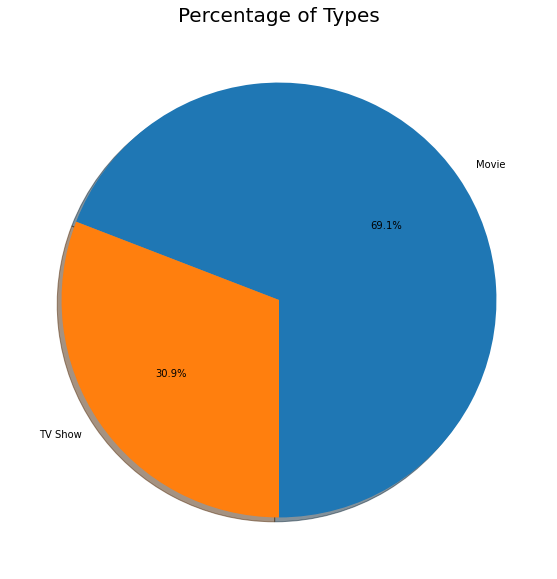

In [ ]:
# type wise distribution 

plt.rcParams['figure.figsize'] = [10,10]
plt.pie(x = Netflix_df['type'].value_counts(), labels=['Movie','TV Show'], autopct='%1.1f%%', shadow=True, startangle=270,);
plt.title('Percentage of Types', fontsize= 20 , y= 1.0);

**The most available content in netflix is Movies its captured 69.1 % space in Data frame**

## **Rating**

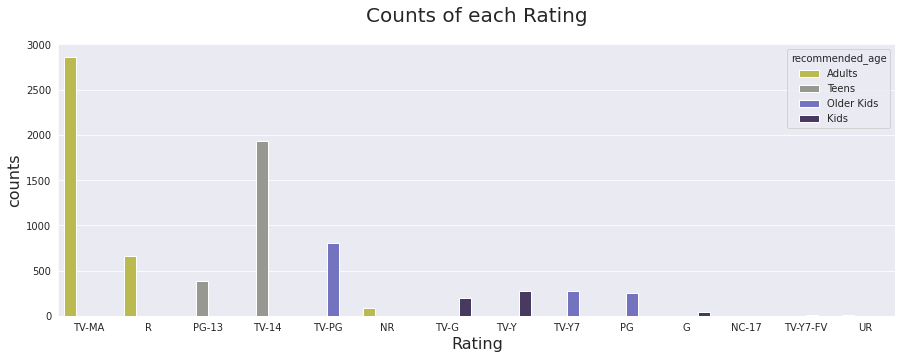

In [ ]:
# rating wise distributon 

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.countplot(x='rating',hue='recommended_age', palette='gist_stern_r', data= Netflix_df);
plt.xlabel('Rating',fontsize=16)
plt.ylabel('counts',fontsize=16)
plt.title('Counts of each Rating', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

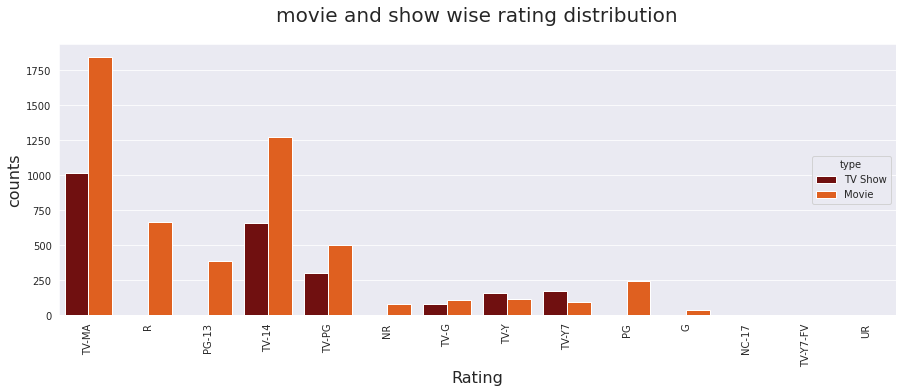

In [ ]:
# movie and show wise rating distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(x='rating', hue='type', palette='gist_heat', data= Netflix_df);
plt.xlabel('Rating',fontsize=16)
plt.ylabel('counts',fontsize=16)
plt.title('movie and show wise rating distribution', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "center right")

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

The rating TV-MA and TV-14 are have high numbers of Tv shows and Movies this two ratings are recommended for Adults and Teens Respectively

## **Release Year**

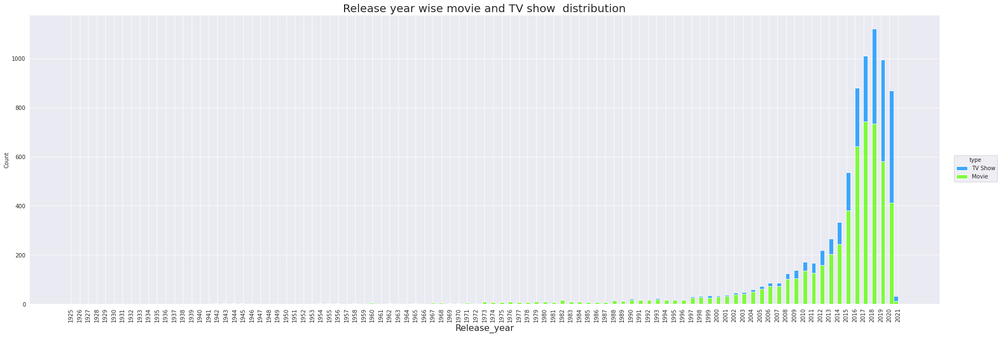

In [ ]:
# realese year wise movies and tv shows distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.displot(x='release_year', hue='type', kind='hist', height=8, aspect=3, multiple='stack' ,palette='gist_rainbow_r', data= Netflix_df);
plt.xticks(ticks= np.arange(Netflix_df.release_year.min(),Netflix_df.release_year.max()+1,1))
plt.xlabel('Release_year',fontsize=16)
plt.title('Release year wise movie and TV show  distribution', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "center right")

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

**based on above analysis from 2000 to 2018 movies and shows are have highly released but in 2019 to 2021 ist slowly get decrease may be its happened because of COVID**

## **Added on Netflix**

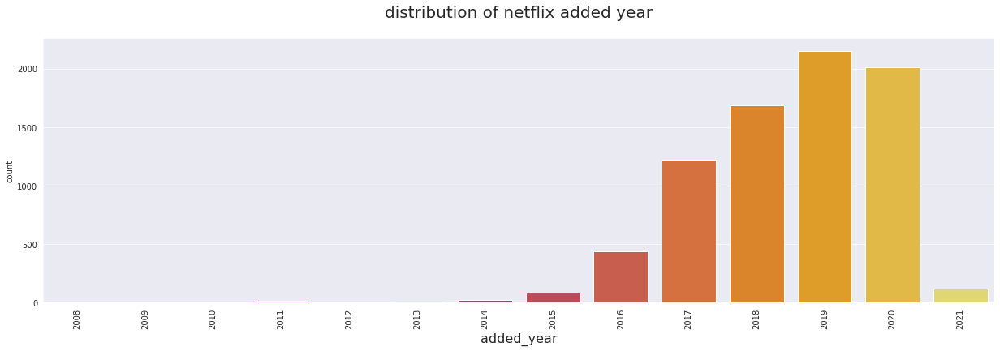

In [ ]:
# distribustion of added year

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [21,6]
ax = sns.countplot(x='year', palette='inferno', data= Netflix_df);
plt.xlabel('added_year',fontsize=16)
plt.title('distribution of netflix added year', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

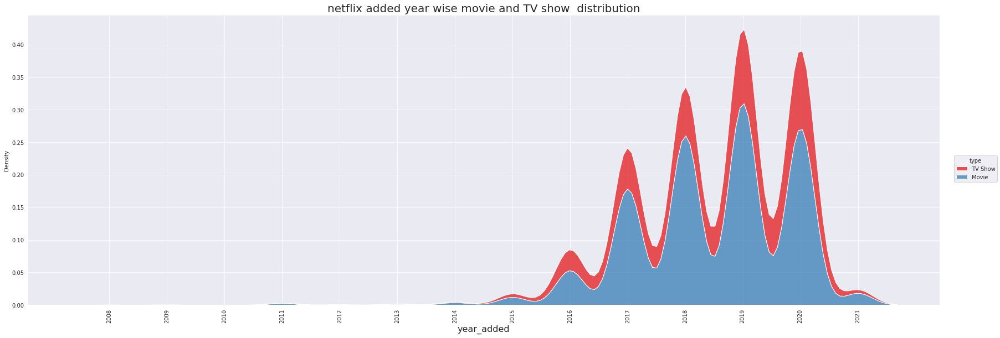

In [ ]:
# added year wise movie and TV show  distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.displot(x='year', hue='type', kind='kde', height=8, aspect=3, multiple='stack' ,palette='Set1', data= Netflix_df);
plt.xlabel('year_added',fontsize=16)
plt.xticks(ticks= np.arange(2008,2021+1,1))
plt.title('netflix added year wise movie and TV show  distribution', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "center right")

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

**based on year wise analysis from 2016 to 2019 movies and shows are have highly added in netflx but in 2019 to 2021 ist slowly get decrease may be its happened because of COVID**

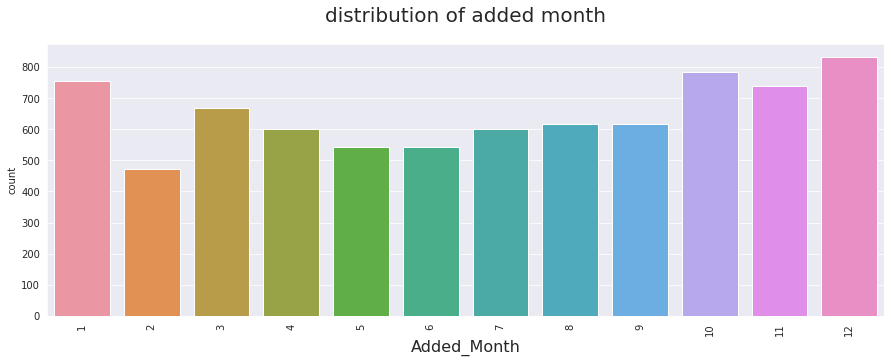

In [ ]:
# distribustion of added month

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(x='month', data= Netflix_df);
plt.xlabel('Added_Month',fontsize=16)
plt.title('distribution of added month', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

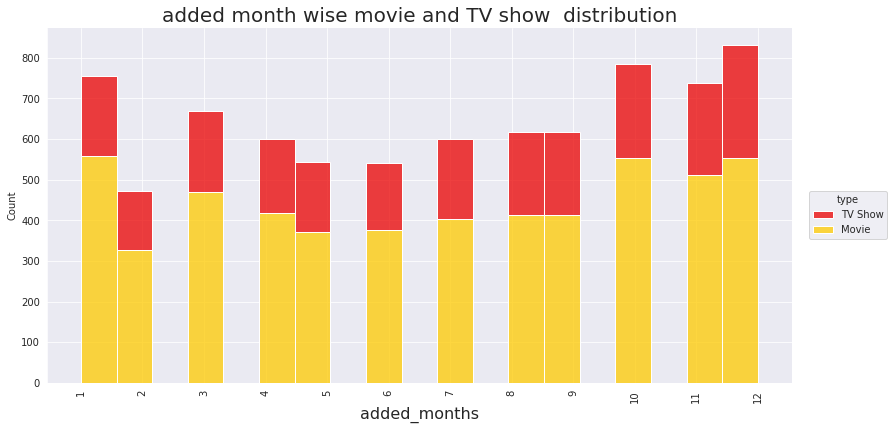

In [ ]:
# added month wise movie and TV show  distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.displot(x='month', hue='type', kind='hist', height=5.66, aspect=2, multiple='stack' ,palette='hot', data= Netflix_df);
plt.xlabel('added_months',fontsize=16)
plt.xticks(ticks= np.arange(Netflix_df.month.min(),Netflix_df.month.max()+1,1))
plt.title('added month wise movie and TV show  distribution', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "center right")

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);

**Month wise analysis many of the movies and tv shows are released during year end and year starting**

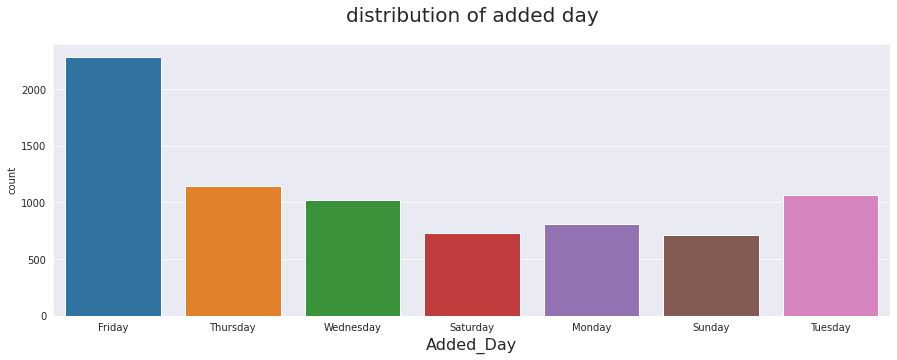

In [ ]:
# distribustion of added day 

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(x='day', data= Netflix_df);
plt.xlabel('Added_Day',fontsize=16)
plt.title('distribution of added day', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)


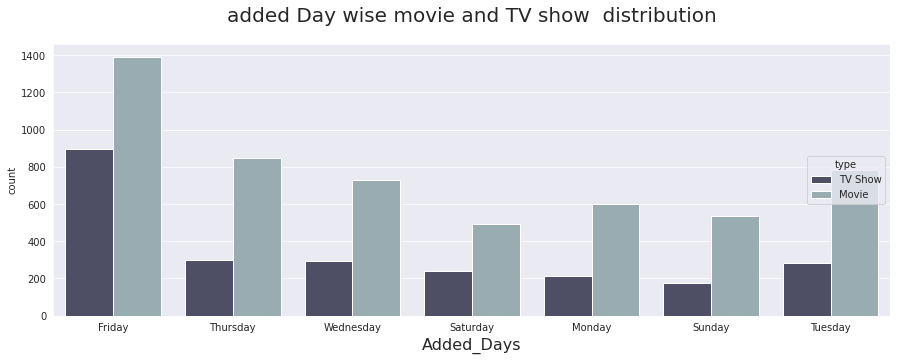

In [ ]:
# added Day wise movie and TV show  distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(x='day', hue='type', palette='bone', data= Netflix_df);
plt.xlabel('Added_Days',fontsize=16)
plt.title('added Day wise movie and TV show  distribution', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "center right")

plt.tick_params(axis='both' , which='major', labelsize=10)

**Many of the Tv shows and Movies are released Friday, its may be friday is week last day so many pepoles can watch.**

## **Genere**

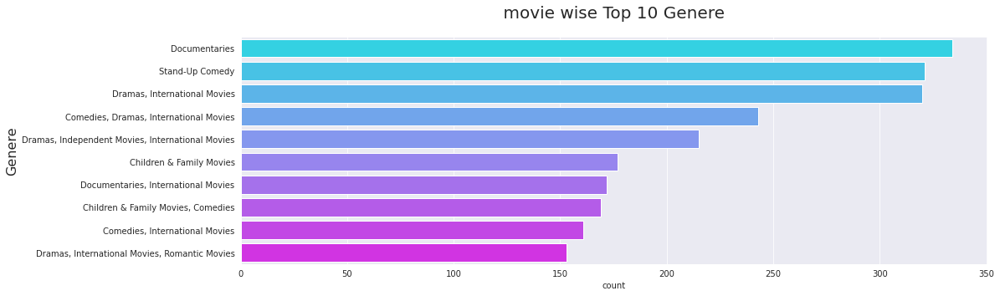

In [ ]:
# Genere wise movie and TV show  distribution

tv_shows= Netflix_df[Netflix_df['type']=='TV Show']
movies= Netflix_df[Netflix_df['type']=='Movie']

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [16,5]
sns.countplot(y=movies['listed_in'], palette='cool',order=movies['listed_in'].value_counts().index[0:10], data= movies);
plt.ylabel('Genere',fontsize=16)
plt.title(' movie wise Top 10 Genere ', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**Movies wise Documentaries, Stand up comedy and dramas generes are captured top places** 

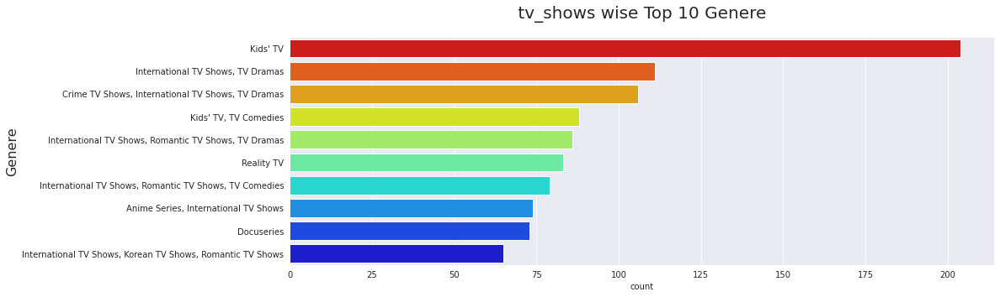

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(y=tv_shows['listed_in'], palette='jet_r',order=tv_shows['listed_in'].value_counts().index[0:10], data=tv_shows);
plt.ylabel('Genere',fontsize=16)
plt.title(' tv_shows wise Top 10 Genere ', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**Tv show wise Kids, international shows and Tv dramas geners are captured top places** 

## **Director**

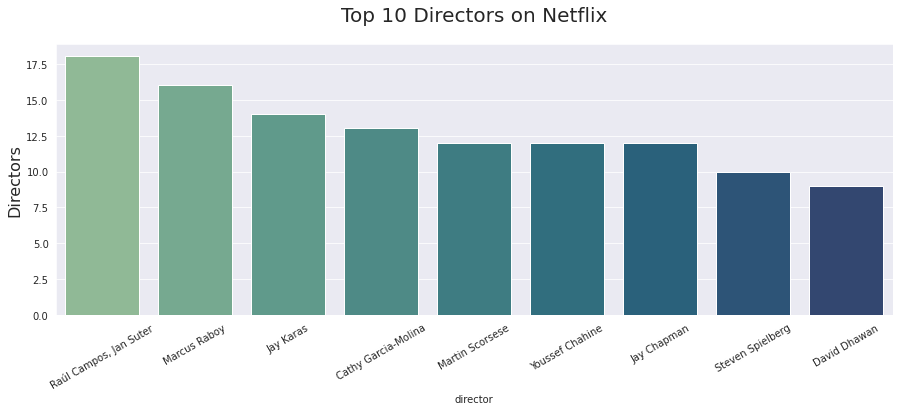

In [ ]:
# Top Directors 

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.countplot(x=Netflix_df['director'], palette='crest',order=Netflix_df['director'].value_counts().index[1:10], data=Netflix_df);
plt.ylabel('Directors',fontsize=16)
plt.title('Top 10 Directors on Netflix', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=30);

**Campos, Suter and raboy are top 3 director in netflix**

## **Actor**

In [ ]:
# finding actors count

actor = Netflix_df['cast'].apply(lambda x :  x.split(',')) 
actor_count = []

for i in actor : 
  actor_count += i

actor_dict = dict((i, actor_count.count(i)) for i in actor_count)
Actor_df = pd.DataFrame(actor_dict.values(),actor_dict.keys()).reset_index().sort_values(0,ascending=False)
Actor_df = Actor_df.sort_values(0, ascending=False).drop(106)

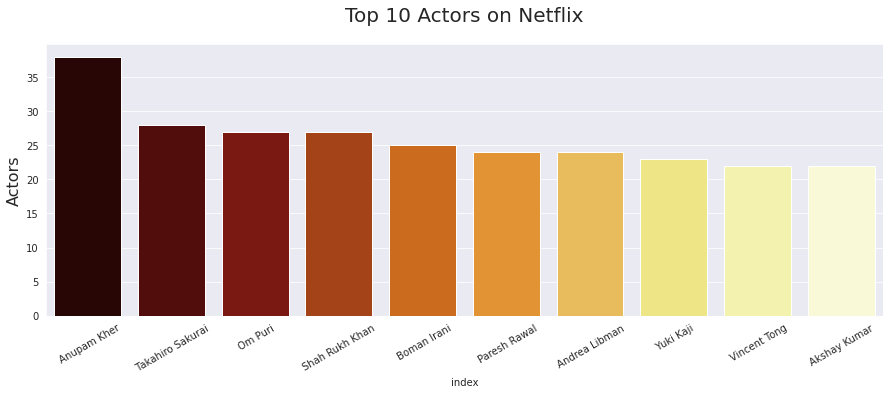

In [ ]:
# Top Actors 

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.barplot(x='index', y=0, palette='afmhot', data=Actor_df.head(10))
plt.ylabel('Actors',fontsize=16)
plt.title('Top 10 Actors on Netflix', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=30);

**Anupupam, Sakurai and Om puri are top 3 actors n netflix**

## **Duration**

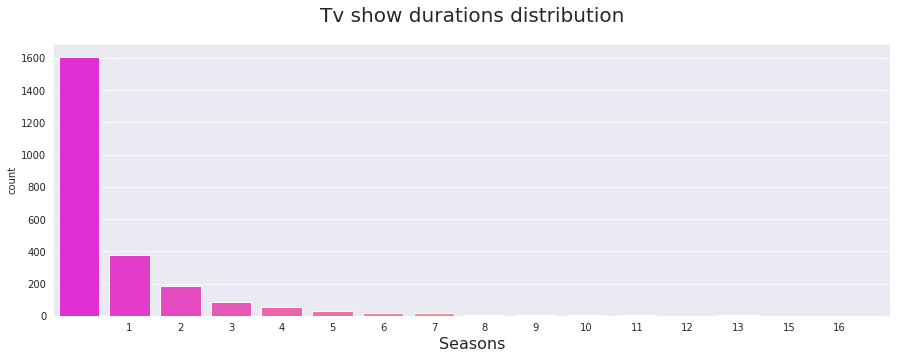

In [ ]:
# Duration wise distribution 

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.countplot(x =tv_shows['duration'],palette='spring', data=tv_shows);
plt.xticks(ticks= np.arange(tv_shows['duration'].min(),tv_shows['duration'].max()+1,1))
plt.xlabel('Seasons',fontsize=16)
plt.title('Tv show durations distribution', fontsize= 20 , y= 1.06)
plt.tick_params(axis='both' , which='major', labelsize=10)

**Many of the netflix tv shows are has single number of Seasons**

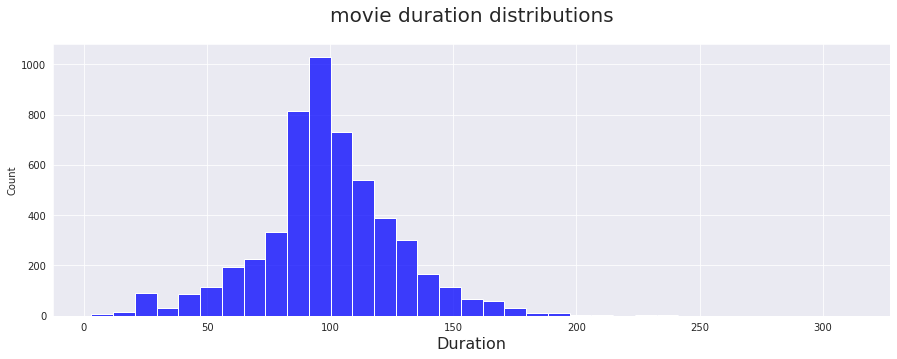

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.histplot(x =movies['duration'],bins=35, color='B', data=movies);
plt.xlabel('Duration',fontsize=16)
plt.title('movie duration distributions', fontsize= 20 , y= 1.06)
plt.tick_params(axis='both' , which='major', labelsize=10)
plt.show()

**Movie Durations are normally distributed, many of the movies has duration between 80 to 100 mins**

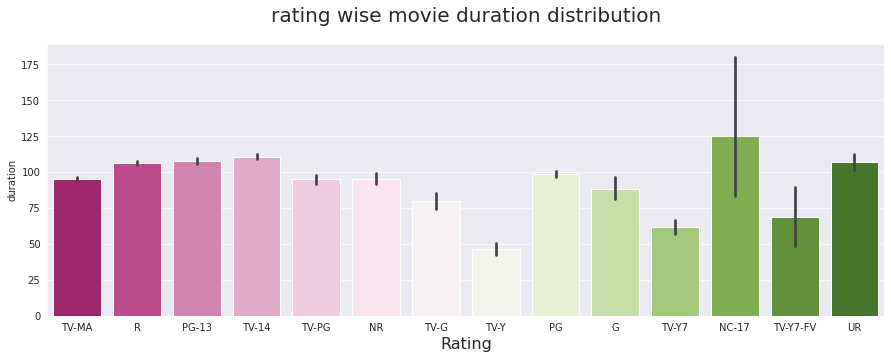

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.barplot(y = movies['duration'], x=movies['rating'], palette='PiYG', data=movies);
plt.xlabel('Rating',fontsize=16)
plt.title('rating wise movie duration distribution', fontsize= 20 , y= 1.06)
plt.tick_params(axis='both' , which='major', labelsize=10)
plt.show()

**Rating wise NC-17 Movies are have high length Durations**

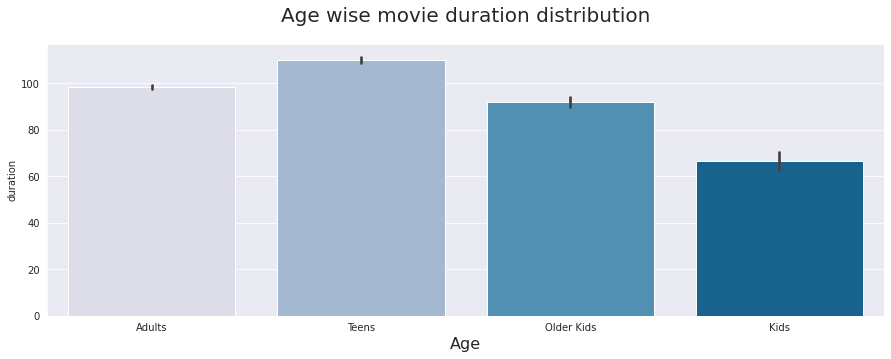

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.barplot(y = movies['duration'], x=movies['recommended_age'], palette='PuBu', data=movies);
plt.xlabel('Age',fontsize=16)
plt.title('Age wise movie duration distribution', fontsize= 20 , y= 1.06)
plt.tick_params(axis='both' , which='major', labelsize=10)
plt.show()

**As per above chart the teenager Movies are has high length durations**

## **Country**

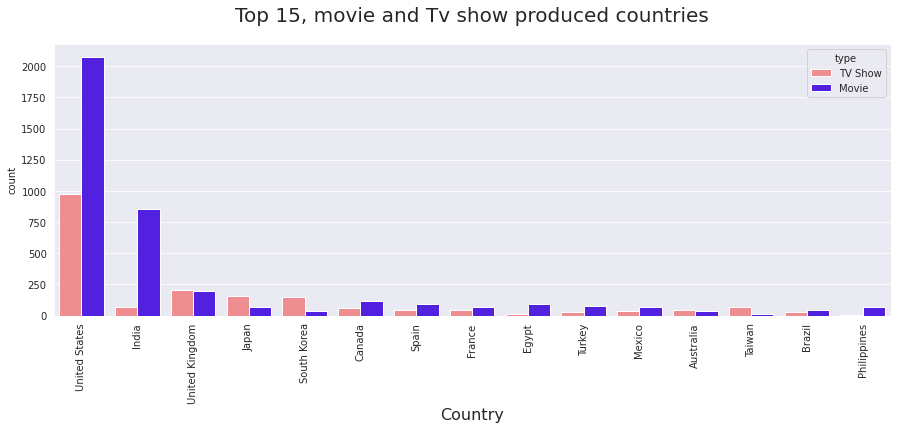

In [ ]:
# Country wise distribution

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
sns.countplot(x='country', order= Netflix_df['country'].value_counts().index[0:15], hue='type', palette='gnuplot2_r', data= Netflix_df);
plt.xlabel('Country',fontsize=16)
plt.title('Top 15, movie and Tv show produced countries', fontsize= 20 , y= 1.06)
plt.tick_params(axis='both' , which='major', labelsize=10)
plt.xticks(rotation=90);
plt.show()

**Most of the Movies and Tv shows are produced in America and in india Compare Tv shows Movies are highly produced**

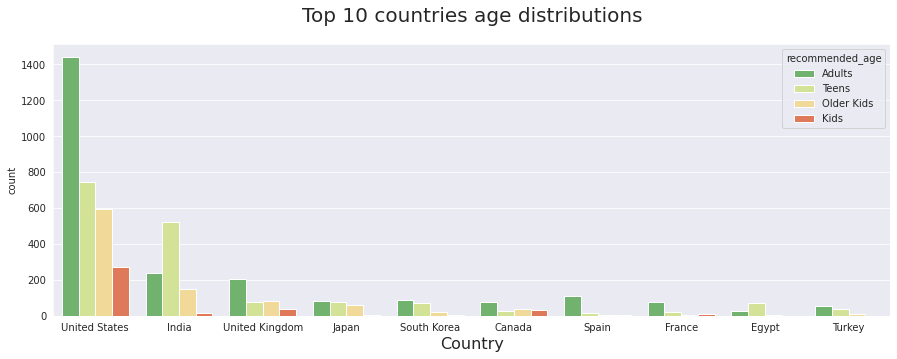

In [ ]:
# country wise age group disribition

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]
ax = sns.countplot(x='country', order= Netflix_df['country'].value_counts().index[0:10], hue='recommended_age', palette='RdYlGn_r', data= Netflix_df);
plt.xlabel('Country',fontsize=16)
plt.title('Top 10 countries age distributions', fontsize= 20 , y= 1.06)
sns.move_legend(ax, "upper right")
plt.tick_params(axis='both' , which='major', labelsize=10)
plt.show()

**In USA the most produced Movies and shows are recommended for adults, but in india highly produced contents are recommended for teen age groups**

# **Feature Selection**

In [ ]:
Netflix_df.columns

Index(['index', 'show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'listed_in', 'description', 'day',
       'year', 'month', 'recommended_age'],
      dtype='object')

In [ ]:
text=['type','recommended_age','release_year','duration','year']
text_df = Netflix_df[text]
text_df.head()

,type,recommended_age,release_year,duration,year
0,TV Show,Adults,2020,4,2020
1,Movie,Adults,2016,93,2016
2,Movie,Adults,2011,78,2018
3,Movie,Teens,2009,80,2017
4,Movie,Teens,2008,123,2020


**Catagorical columns are selected for clustering**

In [ ]:
# For our data clustering, we'll be use text columns.

cluster_df = Netflix_df[['title']]
cluster_df['Text_words'] = (Netflix_df['type'] + ' ' + Netflix_df['description'] + ' ' + Netflix_df['listed_in'] + ' ' + Netflix_df['director']
                            +' ' + Netflix_df['cast'] + ' ' + Netflix_df['country'] + ' ' + Netflix_df['rating']).astype(str)


**text words are combined and filled in text word columns**

In [ ]:
# one hot encoding

OHE = pd.get_dummies(text_df, columns = ['type','recommended_age'])
OHE

,release_year,duration,year,type_Movie,type_TV Show,recommended_age_Adults,recommended_age_Kids,recommended_age_Older Kids,recommended_age_Teens
0,2020,4,2020,0,1,1,0,0,0
1,2016,93,2016,1,0,1,0,0,0
2,2011,78,2018,1,0,1,0,0,0
3,2009,80,2017,1,0,0,0,0,1
4,2008,123,2020,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...
7765,2005,99,2020,1,0,1,0,0,0
7766,2015,111,2019,1,0,0,0,0,1
7767,2019,44,2020,1,0,1,0,0,0
7768,2019,1,2020,0,1,0,0,1,0


# **Feature Engineering**

In [ ]:
cluster_df.head()

,title,Text_words
0,3%,TV Show In a future where the elite inhabit an...
1,7:19,Movie After a devastating earthquake hits Mexi...
2,23:59,"Movie When an army recruit is found dead, his ..."
3,9,"Movie In a postapocalyptic world, rag-doll rob..."
4,21,Movie A brilliant group of students become car...


In [ ]:
# removing punctuation and stop words from text 

import string
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))


def remove_pun_stop(text): 
    x = ''
    y = string.punctuation
    translation = text.maketrans(x,x,y)
    text = text.translate(translation)
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    return " ".join(text)
    
cluster_df['Text_words'] = cluster_df['Text_words'].apply(remove_pun_stop)
cluster_df.head(5)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,title,Text_words
0,3%,tv show future elite inhabit island paradise f...
1,7:19,movie devastating earthquake hits mexico city ...
2,23:59,movie army recruit found dead fellow soldiers ...
3,9,movie postapocalyptic world ragdoll robots hid...
4,21,movie brilliant group students become cardcoun...


In [ ]:
# object creation for stemming 
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer("english")
stemmer.stem('enjoying')

'enjoy'

In [ ]:
# Stemming the texts

def stemming(text): 
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)
    
cluster_df['Text_words'] = cluster_df['Text_words'].apply(stemming)
cluster_df.head(5)

,title,Text_words
0,3%,tv show futur elit inhabit island paradis far ...
1,7:19,movi devast earthquak hit mexico citi trap sur...
2,23:59,movi armi recruit found dead fellow soldier fo...
3,9,movi postapocalypt world ragdol robot hide fea...
4,21,movi brilliant group student becom cardcount e...


In [ ]:
bag_of_words = cluster_df['Text_words']
bag_of_words

0       tv show futur elit inhabit island paradis far ...
1       movi devast earthquak hit mexico citi trap sur...
2       movi armi recruit found dead fellow soldier fo...
3       movi postapocalypt world ragdol robot hide fea...
4       movi brilliant group student becom cardcount e...
                              ...                        
7765    movi lebanon civil war depriv zozo famili hes ...
7766    movi scrappi poor boy worm way tycoon dysfunct...
7767    movi documentari south african rapper nasti c ...
7768    tv show dessert wizard adriano zumbo look next...
7769    movi documentari delv mystiqu behind bluesrock...
Name: Text_words, Length: 7770, dtype: object

# **Principal Component Analysis**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

T_vector = TfidfVectorizer(max_features=10000)
X = T_vector.fit_transform(bag_of_words)
X = X.toarray()
print(X.shape)
T_vector.get_feature_names_out()

(7770, 10000)


array(['007', '10', '100', ..., 'özgür', 'ünlüoğlu', 'şahin'],
      dtype=object)

In [ ]:
from sklearn.preprocessing import StandardScaler

a=pd.DataFrame(X)
X =  pd.concat([a, OHE], axis=1)
X


,0,1,2,3,4,5,6,7,8,9,...,9999,release_year,duration,year,type_Movie,type_TV Show,recommended_age_Adults,recommended_age_Kids,recommended_age_Older Kids,recommended_age_Teens
0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2020,4,2020,0,1,1,0,0,0
1,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2016,93,2016,1,0,1,0,0,0
2,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2011,78,2018,1,0,1,0,0,0
3,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2009,80,2017,1,0,0,0,0,1
4,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2008,123,2020,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7765,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2005,99,2020,1,0,1,0,0,0
7766,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2015,111,2019,1,0,0,0,0,1
7767,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,2019,44,2020,1,0,1,0,0,0
7768,0.0,0.0,0.0,0.0,0.265903,0.0,0.0,0.0,0.0,0.0,...,0.0,2019,1,2020,0,1,0,0,1,0


In [ ]:
from sklearn.decomposition import PCA
transformer = PCA()
#transformer.fit(X)

In [ ]:
#sns.set_style("darkgrid")
#plt.rcParams['figure.figsize'] = [15,5]
#plt.plot(np.cumsum(transformer.explained_variance_ratio_))
#plt.xlabel('number of components')
#plt.xlim([0, 10])
#plt.ylabel('cumulative variance')
#plt.show()

**We can see from the above plot almost 99% of the variance can be explained by 2 components**

In [ ]:
transformer_tuned = PCA(n_components=2)
transformer_tuned.fit(X)
X_transformed = transformer_tuned.transform(X)
X_transformed.shape

(7770, 2)

# **Clusters**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import davies_bouldin_score

# creating function for clustering 

def clusters (algaritham):
  for n_clusters in range(2,10):
        
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X_transformed) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        if algaritham == KMeans:
              clusterer = algaritham(n_clusters=n_clusters, random_state=42)
        else:
              clusterer = algaritham(n_clusters = n_clusters, affinity = 'euclidean', linkage = 'ward')
        cluster_labels = clusterer.fit_predict(X_transformed)

        # The davies_bouldin_score gives the average value for all the samples.
        davies_bouldin = davies_bouldin_score(X_transformed, cluster_labels)
        print("For n_clusters = {}, The average davies_bouldin_score is :{}".format(n_clusters,davies_bouldin))
   
        # The silhouette_score gives the average value for all the samples.
        silhouette_avg = silhouette_score(X_transformed, cluster_labels)
        print("For n_clusters = {}, The average silhouette_score is :{}".format(n_clusters,silhouette_avg))

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_transformed, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.gist_ncar(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])  
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.gist_ncar(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X_transformed[:, 0], X_transformed[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
        
        if algaritham == KMeans:
          # Labeling the clusters
          centers = clusterer.cluster_centers_     
          # Draw white circles at cluster centers
          ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1, s=200, edgecolor="k")     
          for i, c in enumerate(centers):ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("PCA component 1")
        ax2.set_ylabel("PCA component 2")

        if algaritham == KMeans:
           text = 'KMeans'
        else:
           text = 'Agglomerative'
        plt.suptitle("Silhouette analysis for {} clustering on sample data with n_clusters = %d".format(text) % n_clusters,fontsize=14, fontweight="bold")

  plt.show()

### **KMeans Clustering with TfidfVectorizer**

For n_clusters = 2, The average davies_bouldin_score is :0.30702512618385613
For n_clusters = 2, The average silhouette_score is :0.7455302527893161
For n_clusters = 3, The average davies_bouldin_score is :0.5743718706348163
For n_clusters = 3, The average silhouette_score is :0.6239704605382139
For n_clusters = 4, The average davies_bouldin_score is :0.5976456325717726
For n_clusters = 4, The average silhouette_score is :0.6033112929703413
For n_clusters = 5, The average davies_bouldin_score is :0.6411677223261639
For n_clusters = 5, The average silhouette_score is :0.5910539028854976
For n_clusters = 6, The average davies_bouldin_score is :0.6389149401446339
For n_clusters = 6, The average silhouette_score is :0.6089895459305977
For n_clusters = 7, The average davies_bouldin_score is :0.6472795133154795
For n_clusters = 7, The average silhouette_score is :0.5798908796978355
For n_clusters = 8, The average davies_bouldin_score is :0.681180962103598
For n_clusters = 8, The average silh

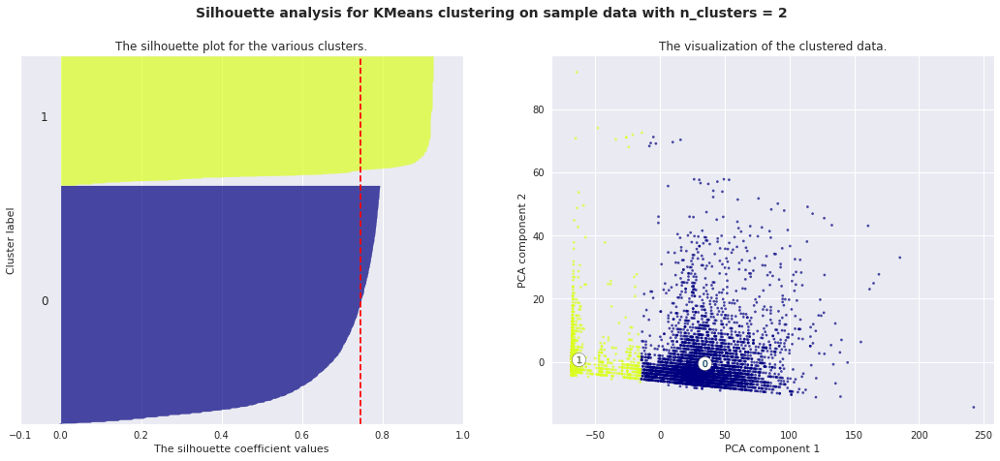

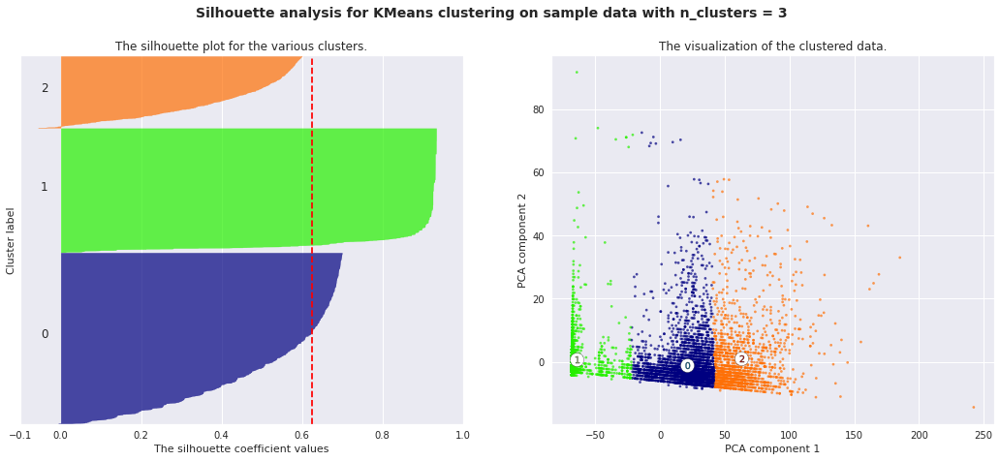

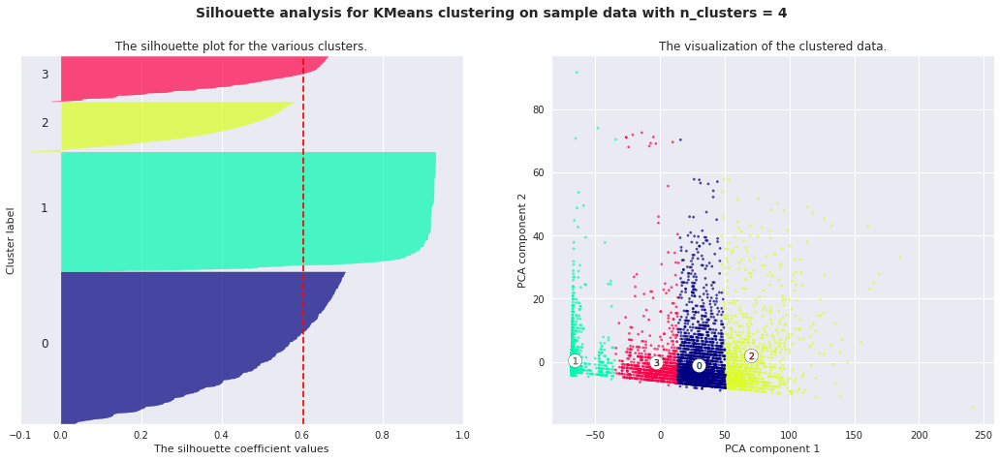

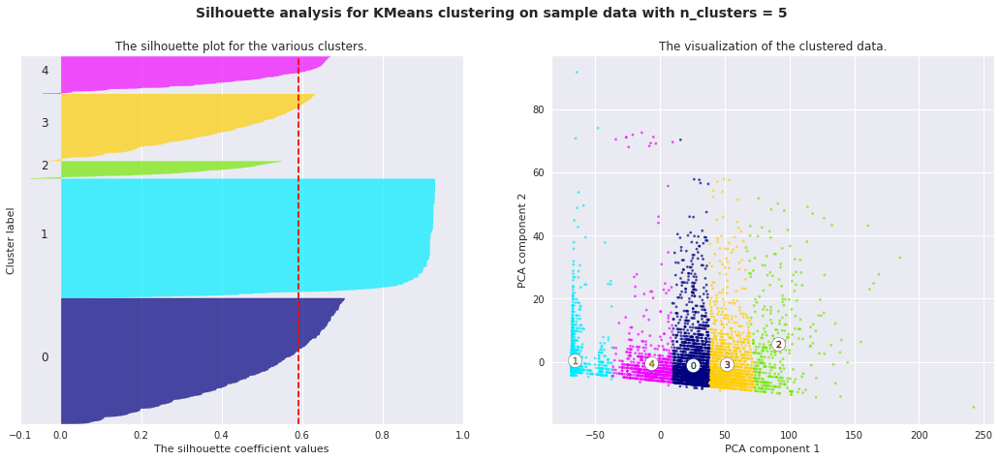

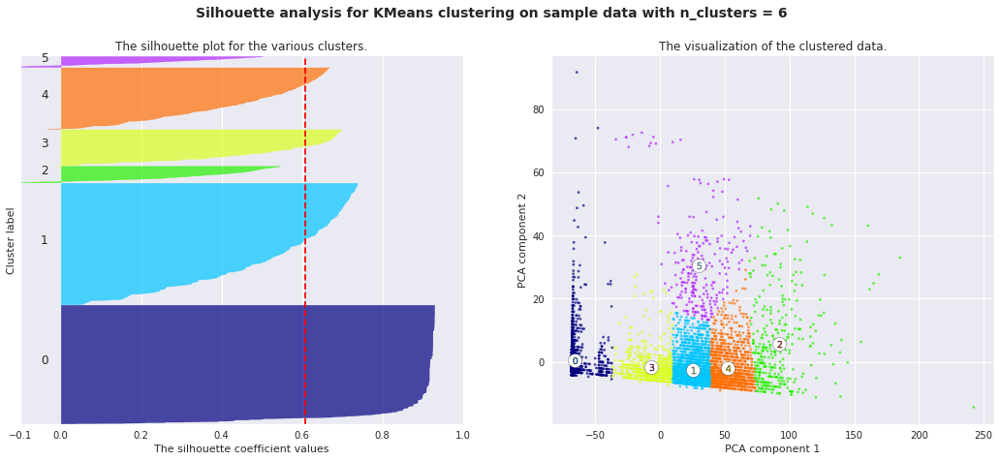

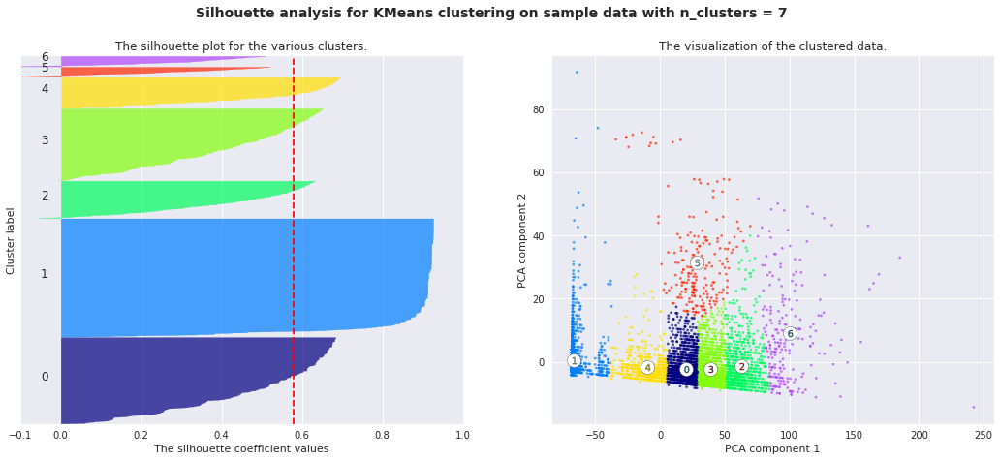

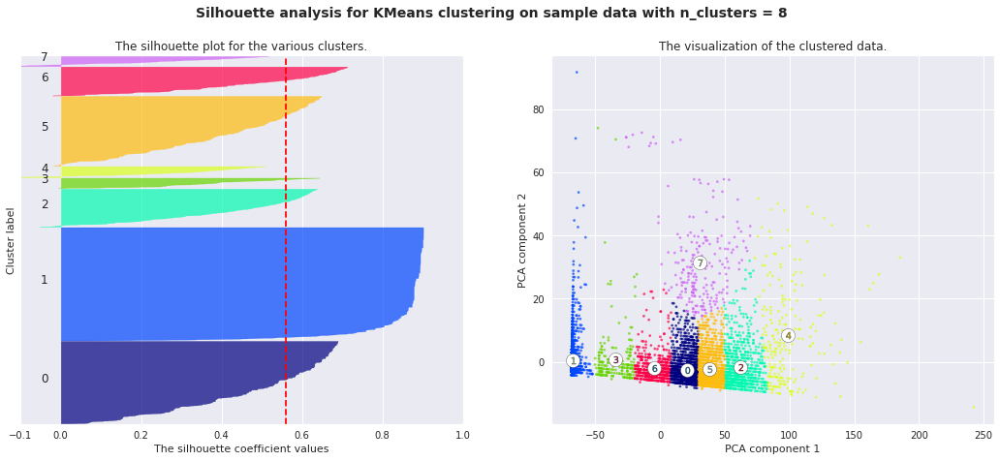

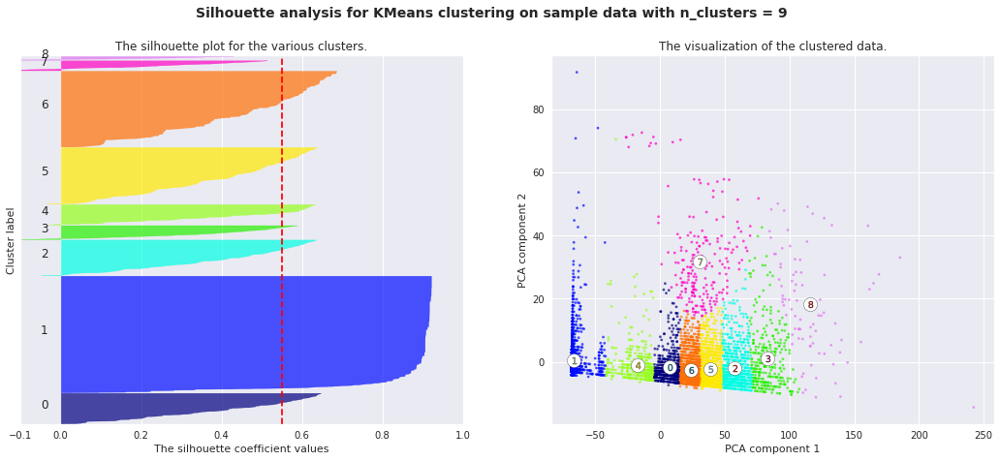

In [ ]:
clusters(KMeans)

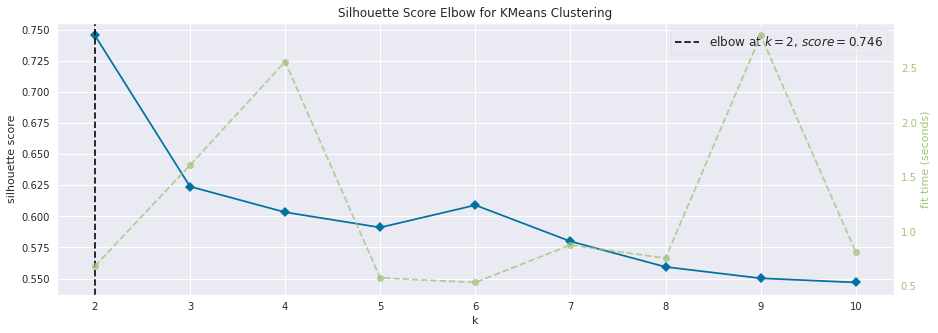

In [ ]:
# optimum K value using Metric:Shilhouette

from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, metric='silhouette', timings=True, locate_elbow=True)
visualizer.fit(X_transformed)
visualizer.show()

**the highest silhouette score is 0.74 and its was obtained from 2nd cluster**

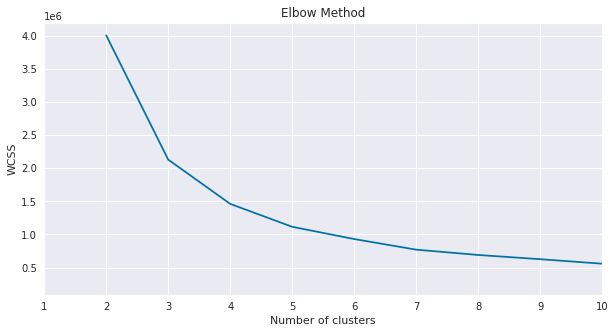

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10,5]
wcss = []
for i in range(2, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=10, random_state=42)
    kmeans.fit(X_transformed)
    wcss.append(kmeans.inertia_)
plt.plot(range(2, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.xlim([1, 10])
plt.ylabel('WCSS')
plt.show()

**Based the above graph we perform cluster by k=4**

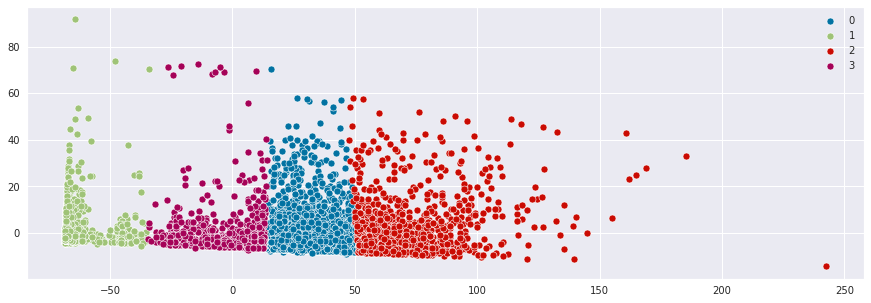

davies_bouldin_score is 0.5976456325717726
Silhouette Coefficient is 0.6033112929703413


In [ ]:
from sklearn.metrics import davies_bouldin_score

# visualizing cluster by scatter plot
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]

kmeans= KMeans(n_clusters=4, init= 'k-means++', random_state=42)
kmeans.fit(X_transformed)

#predict the labels of clusters.
label = kmeans.fit_predict(X_transformed)
#Getting unique labels
unique_labels = np.unique(label)

kmeans_davies_bouldin_score = davies_bouldin_score(X_transformed, label)
kmeans_Silhouette_Coefficient = silhouette_score(X_transformed,label, metric='euclidean')
 
#plotting the results:
for i in unique_labels:
    sns.scatterplot(x = X_transformed[label == i , 0] , y = X_transformed[label == i , 1], label = i )
plt.legend()
plt.show()


print(f"davies_bouldin_score is {kmeans_davies_bouldin_score}")
print(f"Silhouette Coefficient is {kmeans_Silhouette_Coefficient}")

### **Agglomerative Clustering with TfidfVectorizer**

For n_clusters = 2, The average davies_bouldin_score is :0.26837257511131596
For n_clusters = 2, The average silhouette_score is :0.7252616861641785
For n_clusters = 3, The average davies_bouldin_score is :0.5715280327449094
For n_clusters = 3, The average silhouette_score is :0.5893978834734727
For n_clusters = 4, The average davies_bouldin_score is :0.603524630154686
For n_clusters = 4, The average silhouette_score is :0.5977499935349719
For n_clusters = 5, The average davies_bouldin_score is :0.6121097624841045
For n_clusters = 5, The average silhouette_score is :0.5830698707669849
For n_clusters = 6, The average davies_bouldin_score is :0.6654155179275265
For n_clusters = 6, The average silhouette_score is :0.60407416969901
For n_clusters = 7, The average davies_bouldin_score is :0.7437737070098643
For n_clusters = 7, The average silhouette_score is :0.5195709354865699
For n_clusters = 8, The average davies_bouldin_score is :0.7440525722583978
For n_clusters = 8, The average silhou

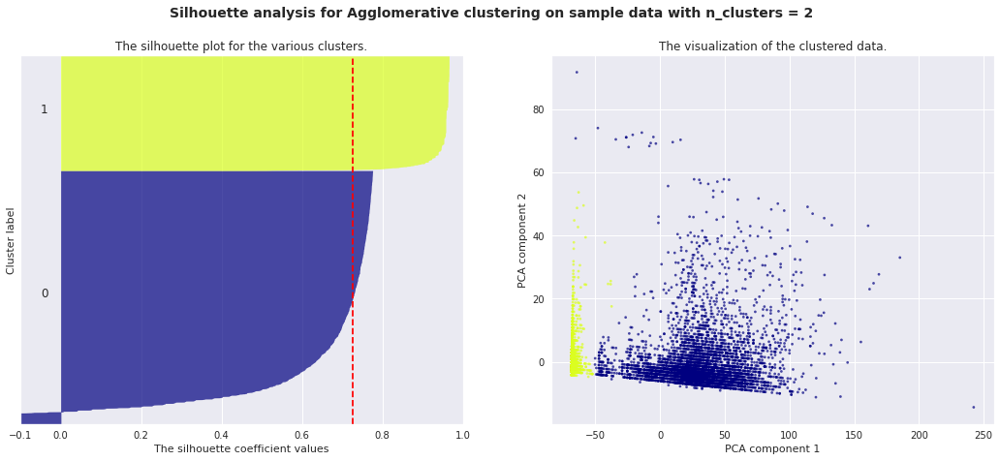

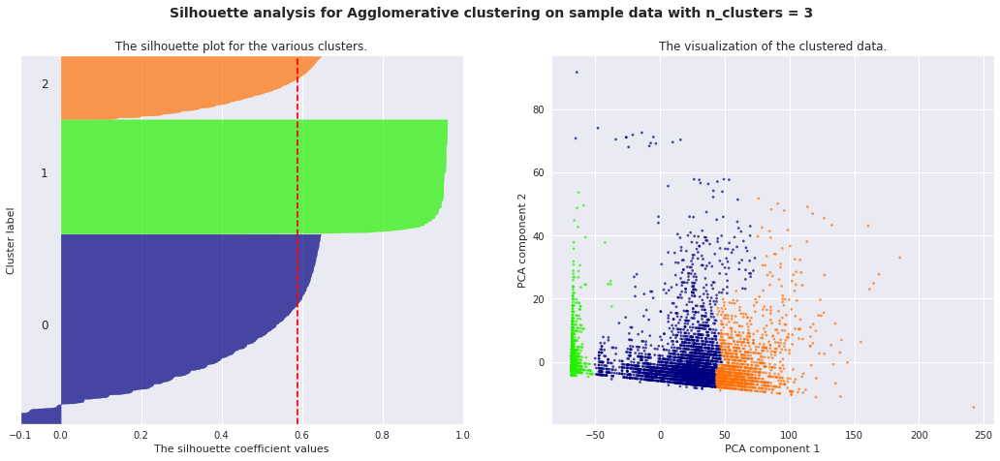

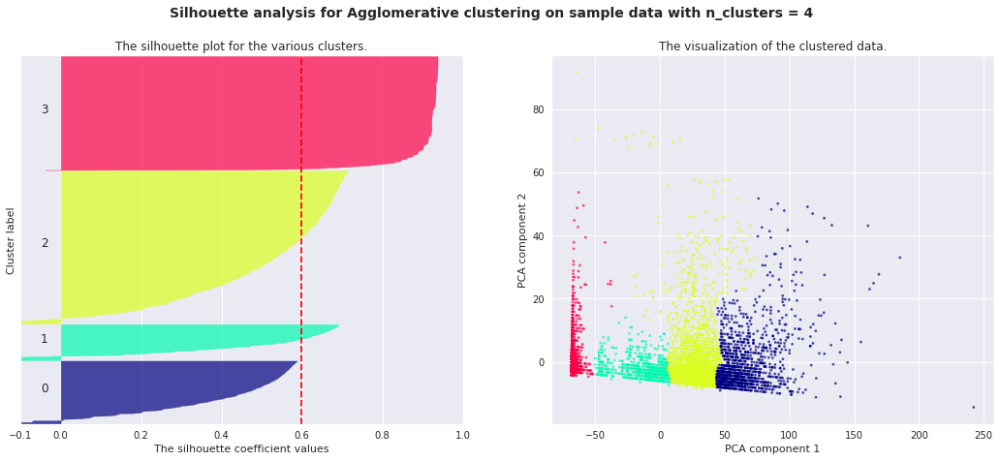

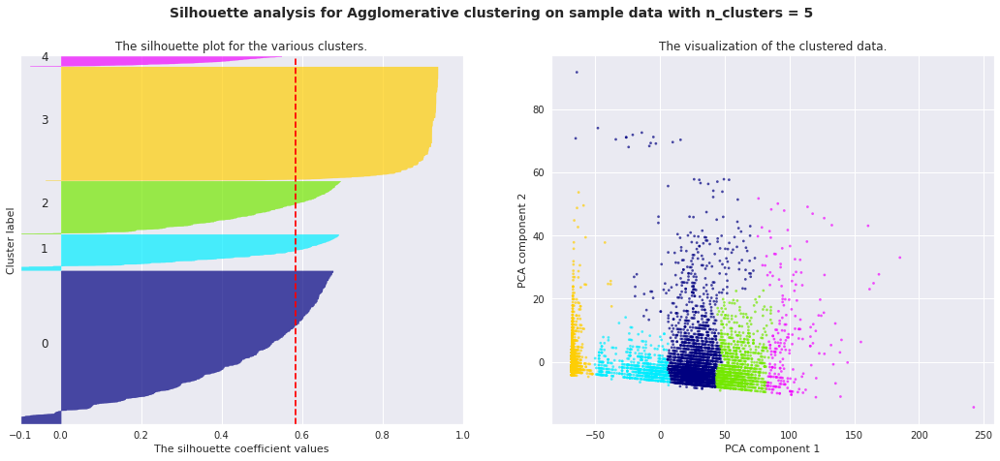

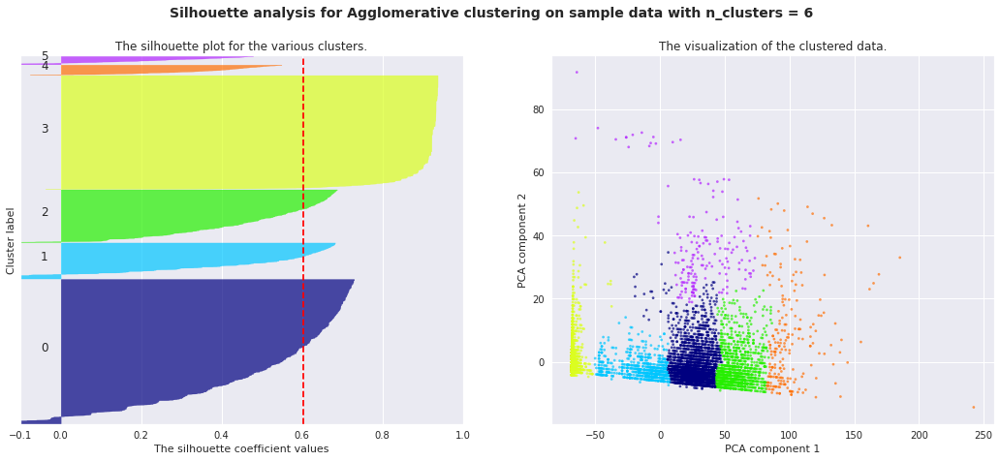

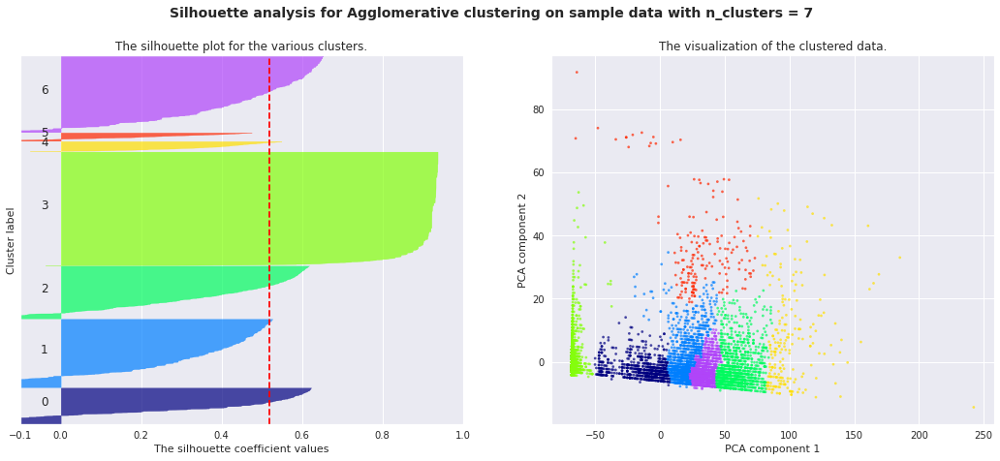

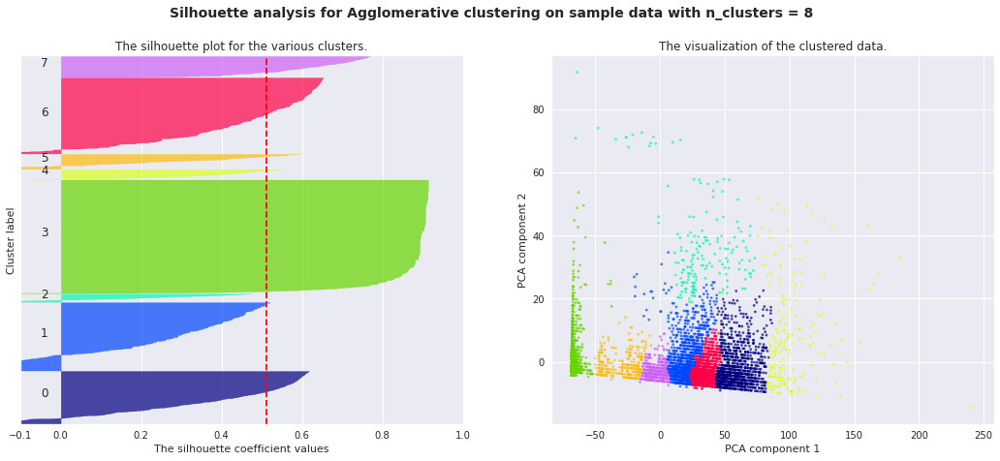

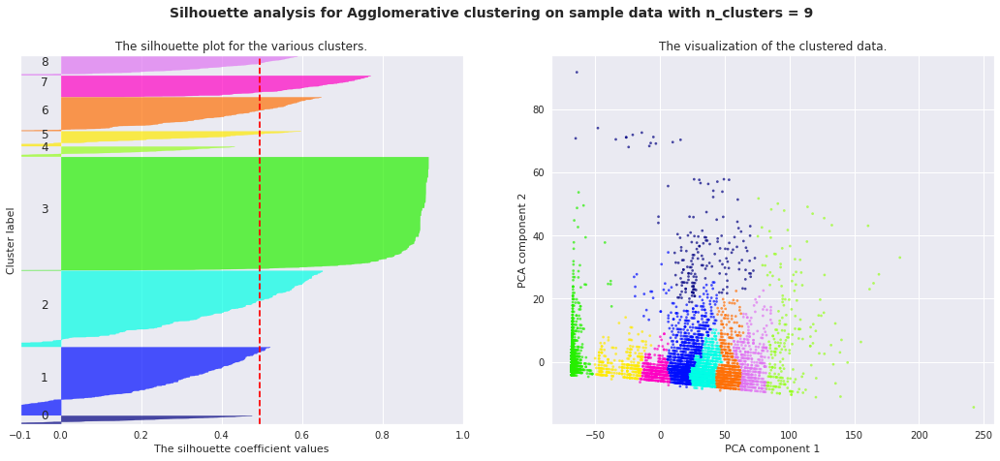

In [ ]:
clusters(AgglomerativeClustering)

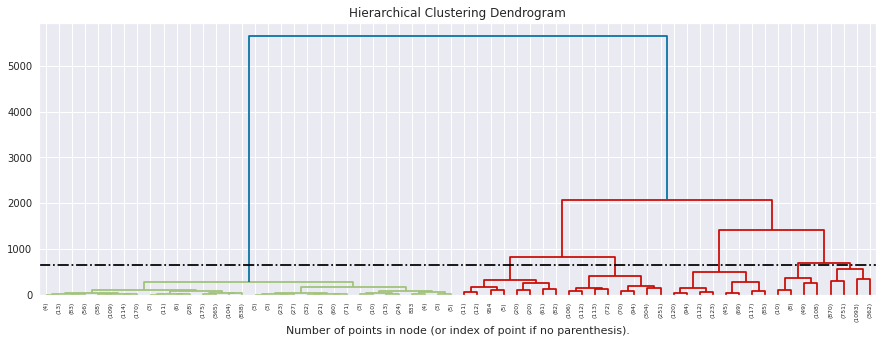

In [ ]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage = 'ward', affinity = 'euclidean')

model = model.fit(X_transformed)
plt.title("Hierarchical Clustering Dendrogram")

# plot the top three levels of the dendrogram

plot_dendrogram(model, truncate_mode="level", p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.axhline(y= 650, color='black', linestyle='-.')
plt.show()

**Number of optimal clusters from Dendogram are 5**

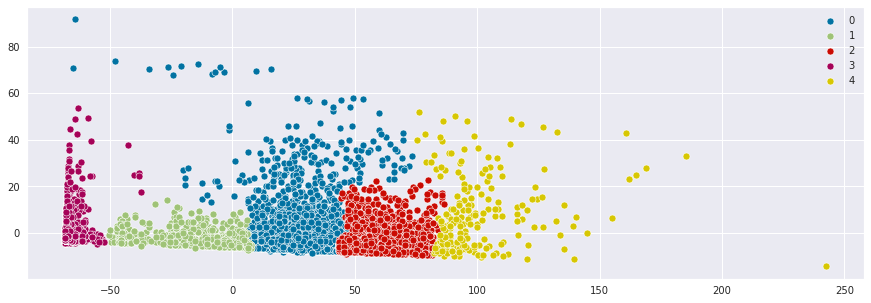

davies_bouldin_score is 0.6121097624841045
Silhouette Coefficient is 0.6121097624841045


In [ ]:
# visualizing cluster by scatter plot

sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [15,5]

Agglomerative = AgglomerativeClustering( n_clusters=5, linkage = 'ward', affinity = 'euclidean')
Agglomerative.fit(X_transformed)

#predict the labels of clusters.
label = Agglomerative.fit_predict(X_transformed)
#Getting unique labels
unique_labels = np.unique(label)

Agglomerative_davies_bouldin_score = davies_bouldin_score(X_transformed, label)
Agglomerative_Silhouette_Coefficient = silhouette_score(X_transformed,label, metric='euclidean')
 
#plotting the results:
for i in unique_labels:
    sns.scatterplot(x = X_transformed[label == i , 0] , y = X_transformed[label == i , 1], label = i)
plt.legend()
plt.show()

print(f"davies_bouldin_score is {Agglomerative_davies_bouldin_score}")
print(f"Silhouette Coefficient is {Agglomerative_davies_bouldin_score}")

### **Birch Clustering with TfidfVectorizer**

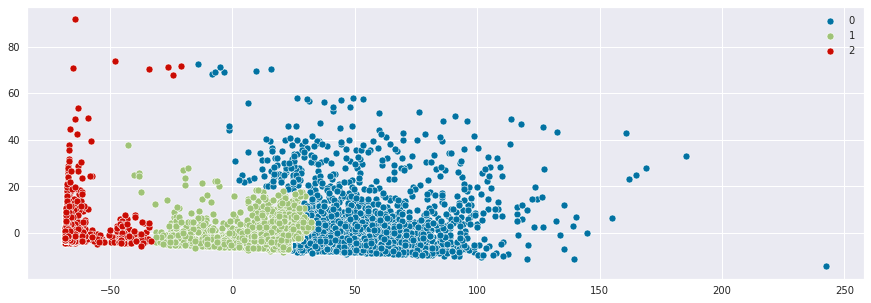

davies_bouldin_score is 0.6600927586224409
Silhouette Coefficient is 0.5326807978658834


In [ ]:
from numpy import unique
from numpy import where
from matplotlib import pyplot
from sklearn.datasets import make_classification
from sklearn.cluster import Birch

# define the model
birch_model = Birch(threshold=0.03)

# train the model
birch_model.fit(X_transformed)

#predict the labels of clusters.
label = birch_model.fit_predict(X_transformed)
#Getting unique labels
unique_labels = np.unique(label)

Birch_davies_bouldin_score = davies_bouldin_score(X_transformed, label)
Birch_Silhouette_Coefficient = silhouette_score(X_transformed,label, metric='euclidean')

#plotting the results:
for i in unique_labels:
    sns.scatterplot(x = X_transformed[label == i , 0] , y = X_transformed[label == i , 1], label = i)
plt.legend()
plt.show()

print(f"davies_bouldin_score is {Birch_davies_bouldin_score}")
print(f"Silhouette Coefficient is {Birch_Silhouette_Coefficient}")

# **Displayng Wordcloud**

In [ ]:
# add clusters numbers to Dataframe 

Netflix_df['cluster_No'] = kmeans.labels_

In [ ]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
def word_cloud(cluster_Number,column_of_choice):
  word_cloud = Netflix_df[['cluster_No',column_of_choice]]
  word_cloud = word_cloud[word_cloud['cluster_No'] == cluster_Number]
  text = " ".join(word for word in word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="Black", colormap = 'Set1').generate(text)
  # Plot the wordclouds
  plt.rcParams['figure.figsize'] = [10,10]
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.title(f'Cluster_No: {cluster_Number}')
  plt.axis("off")
  plt.show()

                     Clusters in director column



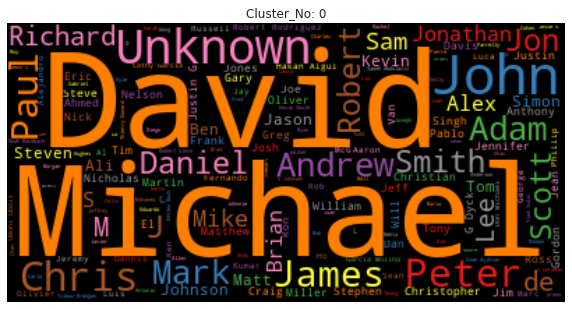

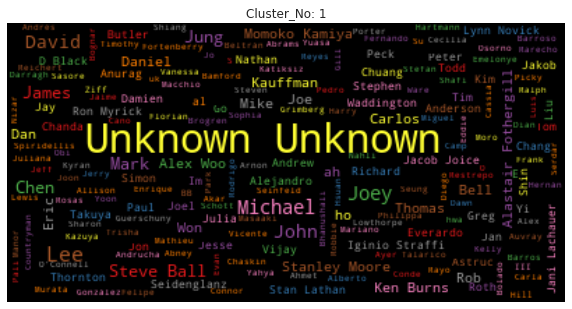

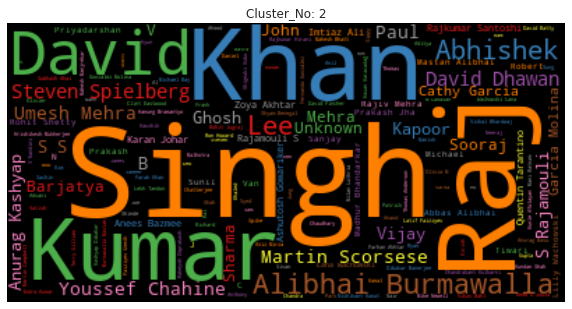

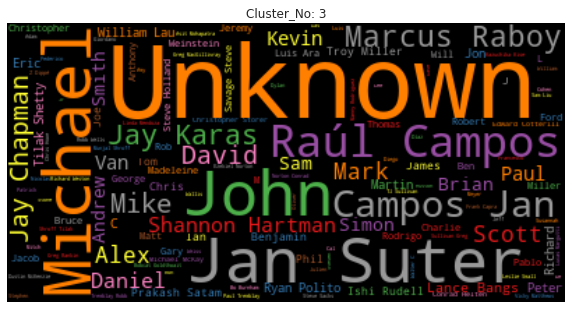


                     Clusters in country column



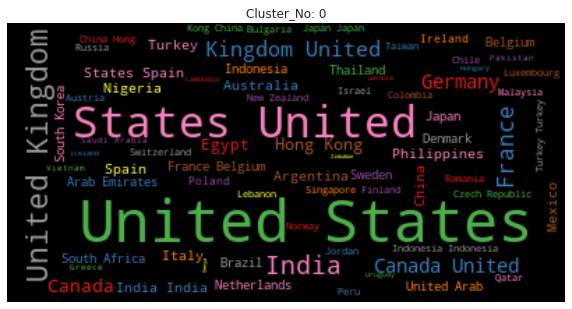

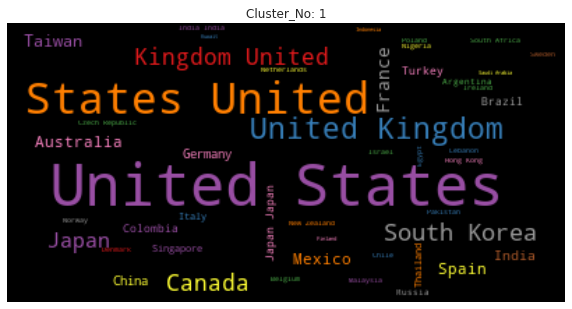

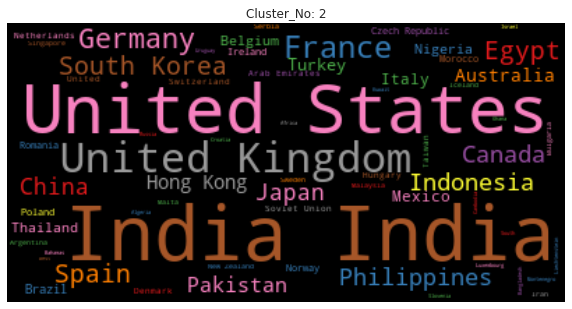

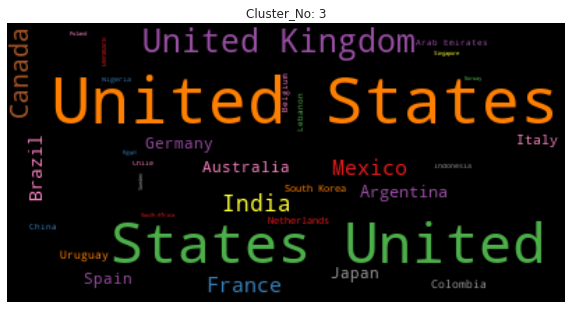


                     Clusters in rating column



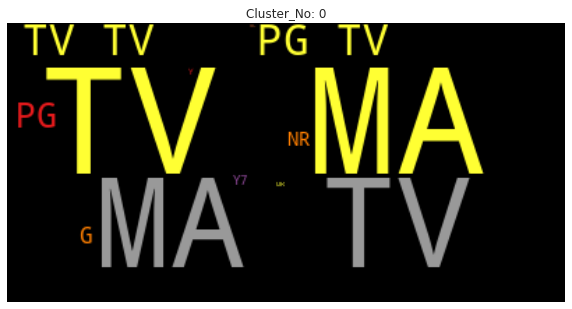

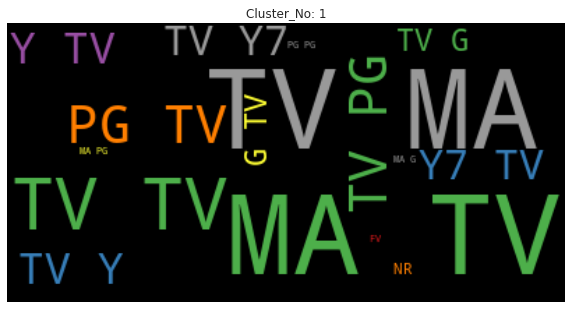

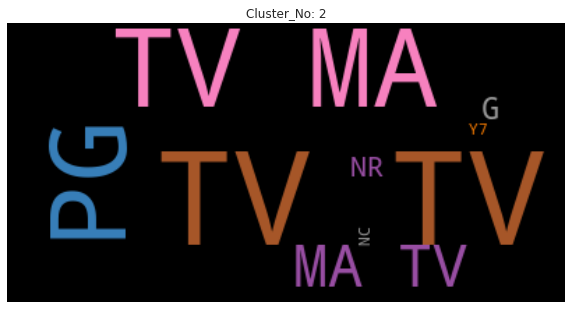

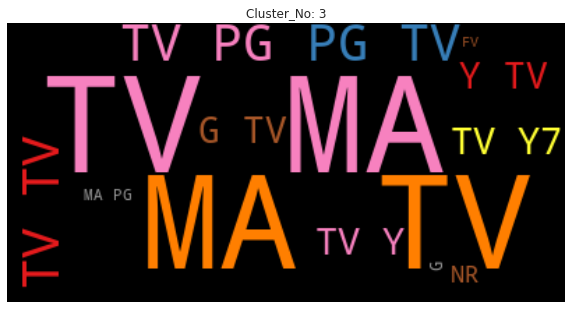


                     Clusters in cast column



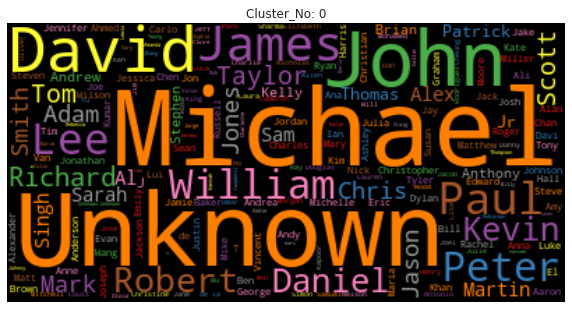

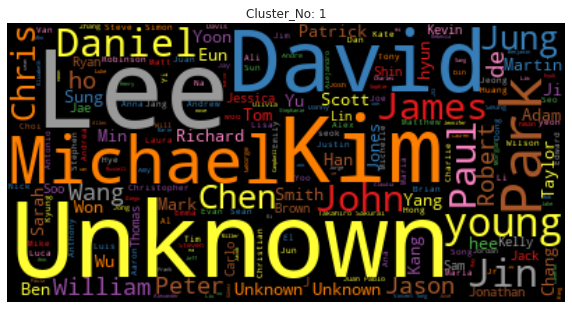

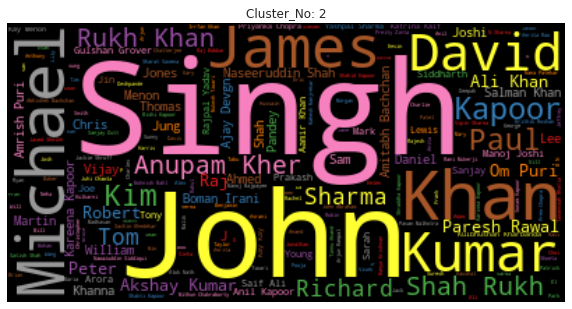

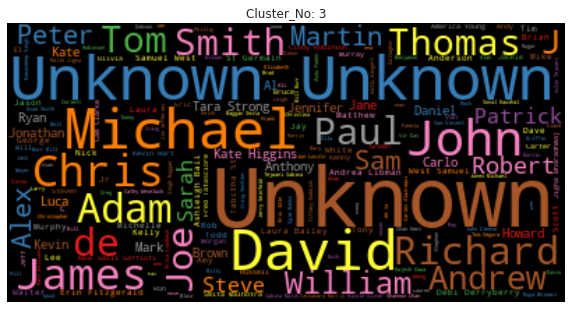


                     Clusters in listed_in column



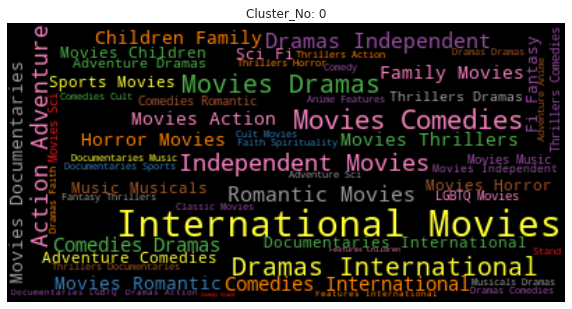

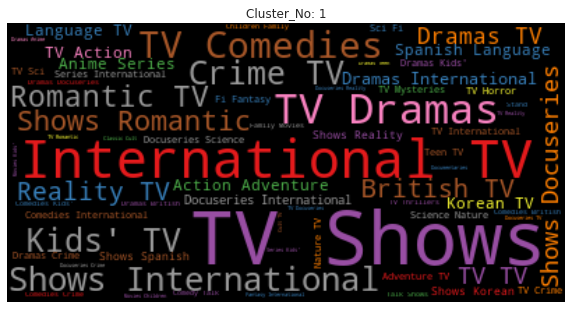

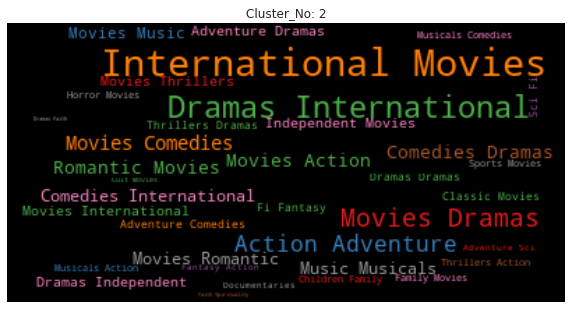

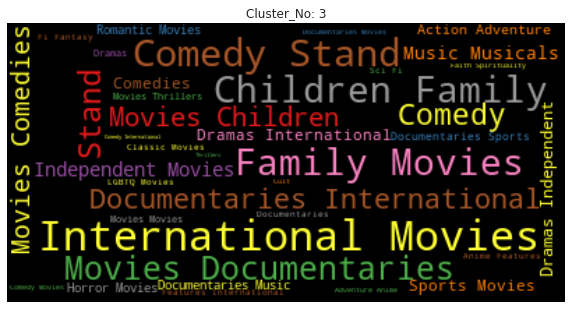


                     Clusters in description column



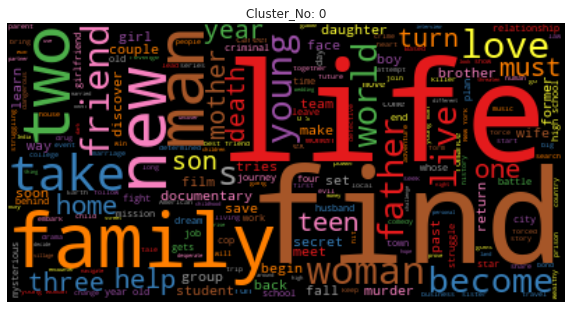

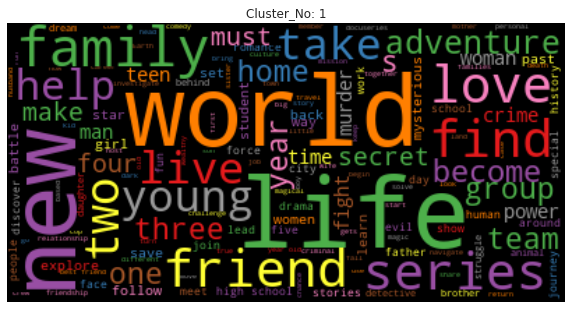

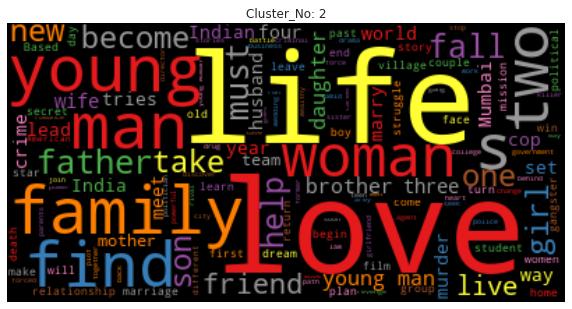

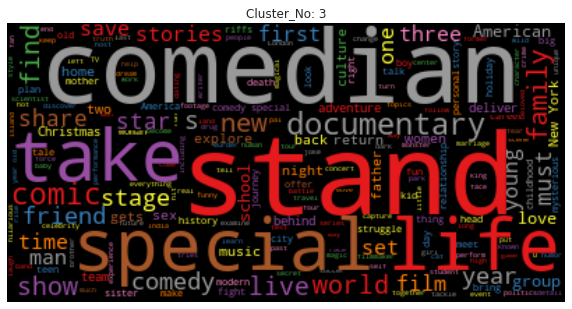

In [ ]:
column_names = ['director','country','rating','cast','listed_in','description']

for columns in column_names:
  print(f'                     Clusters in {columns} column')
  print('')
  for i in range(4):
    word_cloud(i,columns)
    print('')

# **Visualising Data after clustering**

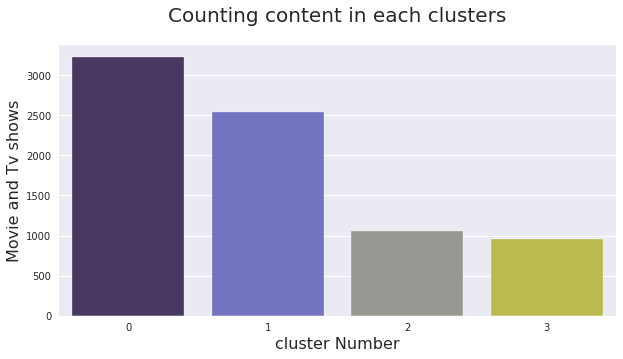

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10,5]
sns.countplot(x='cluster_No', palette='gist_stern', data= Netflix_df);
plt.xlabel('cluster Number',fontsize=16)
plt.ylabel('Movie and Tv shows',fontsize=16)
plt.title('Counting content in each clusters', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**Cluster Number 0 has high number of datas**

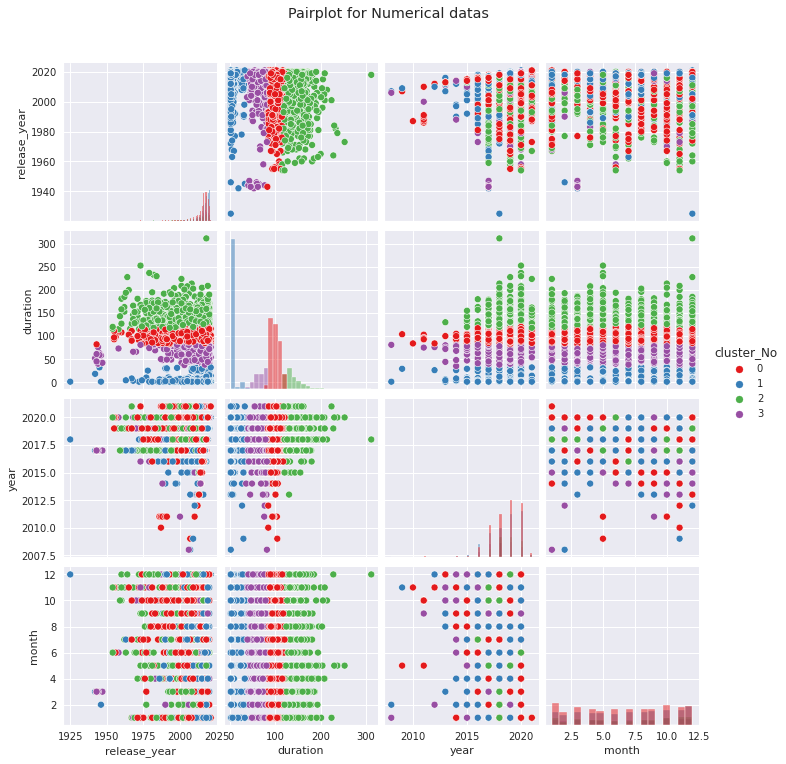

In [ ]:
# Pairplot

g = sns_plot=sns.pairplot(Netflix_df.drop('index',axis=1), hue="cluster_No", diag_kind="hist",palette ='Set1')
g.fig.suptitle("Pairplot for Numerical datas", y=1.06)
plt.show()

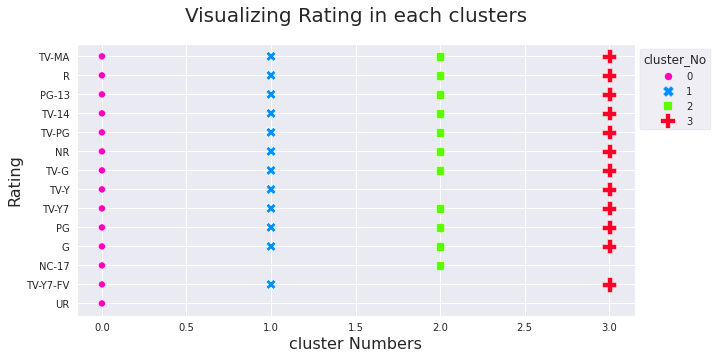

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10,5]
ax = sns.scatterplot(x='cluster_No',y='rating',palette ='gist_rainbow_r', style='cluster_No', sizes=(50,200), 
                     size="cluster_No", hue='cluster_No', data= Netflix_df)

plt.xlabel('cluster Numbers',fontsize=16)
plt.ylabel('Rating',fontsize=16)
sns.move_legend(ax,"upper left", bbox_to_anchor=(1,1), frameon=True)
plt.title('Visualizing Rating in each clusters', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**Cluster Number 0,1,3 are almost have high number ratings**

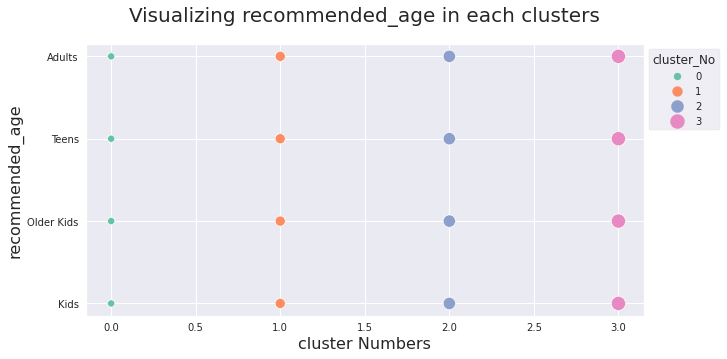

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10,5]
ax = sns.scatterplot(x='cluster_No',y='recommended_age',palette ='Set2', sizes=(50,200), 
                     size="cluster_No", hue='cluster_No', data= Netflix_df)

plt.xlabel('cluster Numbers',fontsize=16)
plt.ylabel('recommended_age',fontsize=16)
sns.move_legend(ax,"upper left", bbox_to_anchor=(1,1), frameon=True)
plt.title('Visualizing recommended_age in each clusters', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**here clusters are equally distrubuted** 

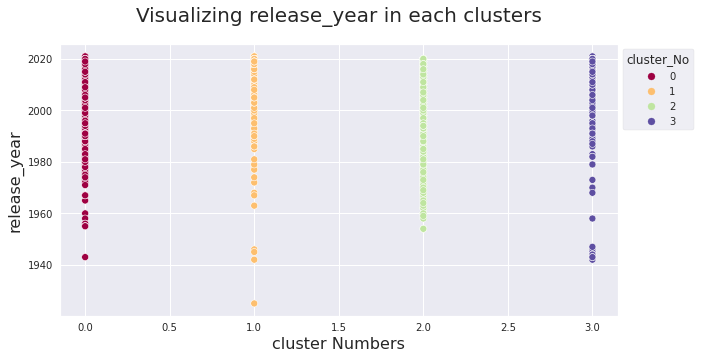

In [ ]:
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10,5]
ax = sns.scatterplot(x='cluster_No',y='release_year',palette ='Spectral', 
                      hue='cluster_No', data= Netflix_df)

plt.xlabel('cluster Numbers',fontsize=16)
plt.ylabel('release_year',fontsize=16)
sns.move_legend(ax,"upper left", bbox_to_anchor=(1,1), frameon=True)
plt.title('Visualizing release_year in each clusters', fontsize= 20 , y= 1.06)

plt.tick_params(axis='both' , which='major', labelsize=10)

**compare to all other clusters, the cluster number 1 has high release years**

In [ ]:
fig = px.scatter(Netflix_df, y="country", x="cluster_No",color="cluster_No", size='cluster_No',
                 color_continuous_scale= px.colors.diverging.BrBG   , title="Country Vs Clusters")
fig.update_traces(marker_size=5)
fig.show()

**Comparitively 4h cluster has less number of Countries**

In [ ]:
fig = px.scatter(Netflix_df, y="listed_in", x="cluster_No",color="cluster_No", size='cluster_No',
                 color_continuous_scale= 'Bluered_r', title="Genere Vs Clusters")
fig.update_traces(marker_size=5)
fig.show()

**As per above chart 3rd and 4th clusters hase less number of generes**

In [ ]:
fig = px.scatter(Netflix_df, y="director", x="cluster_No",color="cluster_No", size='cluster_No',
                 color_continuous_scale= px.colors.sequential.Cividis_r, title="Director Vs Clusters")
fig.update_traces(marker_size=5)
fig.show()

In [ ]:
fig = px.scatter(Netflix_df, y="description", x="cluster_No",color="cluster_No", size='cluster_No',
                 color_continuous_scale= px.colors.sequential.Viridis , title="Description Vs Clusters")
fig.update_traces(marker_size=5)
fig.show()

In [ ]:
fig = px.scatter(Netflix_df, y="cast", x="cluster_No",color="cluster_No", size='cluster_No',
                 color_continuous_scale=['pink','yellow','Blue']  , title="Actor Vs Clusters")
fig.update_traces(marker_size=5)
fig.show()

**Almost all four clusters are have equal number of Actors, dirctors and discriptions**

# **Netflix Movie/Tv show Recommendations System**

## **Recommendations System using cosine_similarity**

In [ ]:
bag_of_words

0       tv show futur elit inhabit island paradis far ...
1       movi devast earthquak hit mexico citi trap sur...
2       movi armi recruit found dead fellow soldier fo...
3       movi postapocalypt world ragdol robot hide fea...
4       movi brilliant group student becom cardcount e...
                              ...                        
7765    movi lebanon civil war depriv zozo famili hes ...
7766    movi scrappi poor boy worm way tycoon dysfunct...
7767    movi documentari south african rapper nasti c ...
7768    tv show dessert wizard adriano zumbo look next...
7769    movi documentari delv mystiqu behind bluesrock...
Name: Text_words, Length: 7770, dtype: object

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer


feature = bag_of_words.tolist()
Count_Vectorizer = CountVectorizer(input=feature, stop_words="english")
count_matrix= Count_Vectorizer.fit_transform(bag_of_words)

cosine_sim = cosine_similarity(count_matrix)
cosine_sim

array([[1.        , 0.10218989, 0.03823596, ..., 0.06917145, 0.30905755,
        0.04757861],
       [0.10218989, 1.        , 0.15590239, ..., 0.21488612, 0.02571722,
        0.0831411 ],
       [0.03823596, 0.15590239, 1.        , ..., 0.17588162, 0.02405626,
        0.07777138],
       ...,
       [0.06917145, 0.21488612, 0.17588162, ..., 1.        , 0.05802589,
        0.50024432],
       [0.30905755, 0.02571722, 0.02405626, ..., 0.05802589, 1.        ,
        0.05986843],
       [0.04757861, 0.0831411 , 0.07777138, ..., 0.50024432, 0.05986843,
        1.        ]])

In [ ]:
indices = pd.Series(cluster_df.title)
indices 

0                                            3%
1                                          7:19
2                                         23:59
3                                             9
4                                            21
                         ...                   
7765                                       Zozo
7766                                     Zubaan
7767                          Zulu Man in Japan
7768                      Zumbo's Just Desserts
7769    ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
Name: title, Length: 7770, dtype: object

In [ ]:
# Netflix recommendation system

def recommendations(Title, cosine_sim = cosine_sim):
    
    recommended_movies = []
    
    # gettin the index of the movie that matches the title
    idx = indices[indices == Title].index[0]

    # creating a Series with the similarity scores in descending order
    score_series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)

    # getting the indexes of the most similar movies
    top_indexes = list(score_series.index)
    
    # populating the list with the titles of the best matching movies
    for i in top_indexes:
        recommended_movies.append(list(cluster_df.title)[i])
        
    return recommended_movies

In [ ]:
# recommendations for Movies.
movie_recommendations = pd.DataFrame(recommendations('Zulu Man in Japan'), columns=['Recommendations'])
movie_recommendations.head(5)

,Recommendations
0,Zulu Man in Japan
1,Roots
2,We Are One
3,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
4,Mexicanos de Bronce


In [ ]:
# recommendations for Tv_Shows.
Tv_Shows_recommendations = pd.DataFrame(recommendations('3%'), columns=['Recommendations'])
Tv_Shows_recommendations.head(5)

,Recommendations
0,3%
1,Back with the Ex
2,Argon
3,Million Pound Menu
4,How To Ruin Christmas


## **Recommended Syestem by sorting**

In [ ]:
# function for index finding 
def find(s, el):
    for i in s.index:
        if s[i] == el: 
            return i
    return None

In [ ]:
#Recommended Syestem by sorting
def Recommended_Syestem (text,column):
  top_indexes =[]
  
  if column == 'cast' or 'listed_in':
    for i in Netflix_df[column].tolist():
      if text in i:
          l = find(Netflix_df[column], i)
          top_indexes.append(l)
  else:
    for i in Netflix_df[column]:
      if text in i:
          l = find(Netflix_df[column], i)
          top_indexes.append(l)

  recommended_movies = []
  Unique_index = set(top_indexes)
  for k in Unique_index:
   recommended_movies.append(list(cluster_df.title)[k])
        
  return recommended_movies

In [ ]:
Netflix_df.columns

Index(['index', 'show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'listed_in', 'description', 'day',
       'year', 'month', 'recommended_age'],
      dtype='object')

In [ ]:
# recommendations for Director wise 
recommendations = pd.DataFrame(Recommended_Syestem('Jorge','director'), columns=['Recommendations'])
recommendations.head(5)

,Recommendations
0,Los Herederos
1,7:19
2,Pablo Escobar: Angel or Demon?
3,ReMastered: Massacre at the Stadium
4,Alelí


In [ ]:
# recommendations for Country wise 
recommendations = pd.DataFrame(Recommended_Syestem('India','country'), columns=['Recommendations'])
recommendations.head(5)

,Recommendations
0,Sardaarji 2
1,Kung Fu Yoga
2,Alibaba Aur 40 Chor
3,Bombairiya
4,Romeo Ranjha


In [ ]:
# recommendations for genere wise 
recommendations = pd.DataFrame(Recommended_Syestem('Horror Movies','listed_in'), columns=['Recommendations'])
recommendations.head(5)

,Recommendations
0,23:59
1,A.M.I.
2,1920
3,Rosemary's Baby
4,Tremors 2: Aftershocks


In [ ]:
# recommendations for cast wise 
recommendations = pd.DataFrame(Recommended_Syestem('Elias','cast'), columns=['Recommendations'])
recommendations.head(5)

,Recommendations
0,Quién te cantará
1,Fuller House
2,Zodiac
3,Fallen
4,Teenage Mutant Ninja Turtles: The Movie


#**Conclusion**

### **Davies bouldin score**

The intuition behind Davies-Bouldin index is the ratio between the within cluster distances and the between cluster distances and computing the average overall the clusters. It is therefore relatively simple to compute, bounded – 0 to 1, lower score is better.

### **Silhouette Coefficient**

The value of the silhouette coefﬁcient is between [-1, 1], A score of 1 denotes the best meaning that the data point i is very compact within the cluster to which it belongs and far away from the other clusters. The worst value is -1 and Values near 0 denote overlapping clusters.

In [ ]:
table = [{'Model Name':'KMeans Clustering with TfidfVectorizer and Elbow method',
        'Davies bouldin score': kmeans_davies_bouldin_score,
        'Silhouette Coefficient': kmeans_Silhouette_Coefficient,
        'Optimum Clusters': 4,       
        },
        {'Model Name':'Agglomerative Clustering with TfidfVectorizer and Dendrogram',
        'Davies bouldin score': Agglomerative_davies_bouldin_score,
        'Silhouette Coefficient': Agglomerative_Silhouette_Coefficient,
        'Optimum Clusters': 5,
        },
        {'Model Name':'Birch Clustering with TfidfVectorizer',
        'Davies bouldin score': Birch_davies_bouldin_score,
        'Silhouette Coefficient': Birch_Silhouette_Coefficient,
        'Optimum Clusters': 3,
        }]

table1 = [{'Model Name':'KMeans Clustering with Tf-idf Vectorizer and Silhouette Score',
        'Davies bouldin score': 0.307025,
        'Silhouette Coefficient': 0.745530,
        'Optimum Clusters': 2,       
        },
        {'Model Name':'Agglomerative Clustering with Tf-idf Vectorizer and Silhouette Score',
        'Davies bouldin score': 0.268372,
        'Silhouette Coefficient': 0.725261,
        'Optimum Clusters': 2, 
        }]

table = pd.DataFrame(table)
table1 = pd.DataFrame(table1)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

display(table)
print(' ')
print(' ')
display(table1)

,Model Name,Davies bouldin score,Silhouette Coefficient,Optimum Clusters
0,KMeans Clustering with TfidfVectorizer and Elbow method,0.597646,0.603311,4
1,Agglomerative Clustering with TfidfVectorizer and Dendrogram,0.612110,0.583070,5
2,Birch Clustering with TfidfVectorizer,0.660093,0.532681,3


,Model Name,Davies bouldin score,Silhouette Coefficient,Optimum Clusters
0,KMeans Clustering with Tf-idf Vectorizer and Silhouette Score,0.307025,0.745530,2
1,Agglomerative Clustering with Tf-idf Vectorizer and Silhouette Score,0.268372,0.725261,2


The table above summarizes the findings of one set of models out of many that we tried..

KMeans Clustering with TfidfVectorizer and Elbow method has the best overall Silhouette Coefficient of 60 percentage and best overall Davies bouldin score 59 percentange.

The optimal Silhouette Coefficient for Agglomerative Clustering with TfidfVectorizer and Dendrogram, Birch Clustering with TfidfVectorizer was 58 and 53 percentage respectively.

The optimal Silhouette Coefficient for KMeans Clustering with Tf-idf Vectorizer and Silhouette Score and Agglomerative Clustering with Tf-idf Vectorizer and Silhouette Score models is 74 and 72 percentage respectively. however the optimal clusters is only 2 for both models so we can't this as best model. 


we'll make KMeans Clustering with TfidfVectorizer and Elbow method model and Agglomerative Clustering with TfidfVectorizer and Dendrogram model as our best model because it provides good overall Davies bouldin score, Silhouette Coefficient and optimum clusters.


* Movies make up 69% of the content on Netflix, while TV shows make up the remaining 31%.

* This was surprising to discover that movies make up the majority of the Netflix content. But lately, it has been concentrating more on television shows.

* The majority of this content is made available either towards the end of the year or at the beginning.

* The ratings TV-MA and TV-14 have a lot of television shows and movies that are suitable for adults and teenagers, respectively.

* The majority of Netflix TV shows only have a single season, while the majority of the movies have running times between 80 and 100 minutes.

* America and India produces the majority of movies and television Shows, But in India Movies are more well produced than television shows.

* Netflix's addition of movies and television shows increased from 2016 to 2019, but from 2019 to 2021, it gradually dropped, possibly as a result of COVID.